In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "MIG-f80e9374-504a-571b-bac0-6fb00750db4c"

In [2]:
import sys
sys.path.append('../2_train_models')
from file_configs import MergedFilesConfig, FoldFilesConfig
from data_loading import extract_sequences, extract_observed_profiles

from motif_hits_utils import load_motif_hits
from load_annotations_utils import load_coords_with_summits

import numpy as np
import torch
import random
import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
# specify what set of models to look at
cell_type = "K562"

# the unique IDs for each of the folds / models in this cell type
timestamps = ["2023-05-29_15-51-40",
              "2023-05-29_15-58-41",
              "2023-05-29_15-59-09",
              "2023-05-30_01-40-06",
              "2023-05-29_23-21-23",
              "2023-05-29_23-23-45",
              "2023-05-29_23-24-11"]

# these usually don't change
model_type = "strand_merged_umap"
data_type = "procap"

# size of the model inputs and outputs
in_window = 2114
out_window = 1000

# motif names below are specific to the K562 profile modisco run
motif_names = ["BRE/SP", "CA-Inr", "ETS", "NFY", "NRF1", "ATF1", "TATA",
               "THAP11", "YY1", "AP1", "TA-Inr", "CTCF", "ZBTB33", "TCT", "TATATA"]

In [5]:
# Load the config objects (filepaths holders) for each fold a model was trained on

def load_fold_configs(cell_type, timestamps,
                      model_type = model_type, data_type = data_type):

    fold_configs = []
    for fold_i, timestamp in enumerate(timestamps):
        # folds are 1-indexed, and config constructor is expecting a string
        fold = str(fold_i + 1)
        
        # load the config object for this specific fold / model
        config = FoldFilesConfig(cell_type, model_type, fold, timestamp, data_type)
        fold_configs.append(config)
        
    return fold_configs

fold_configs = load_fold_configs(cell_type, timestamps)

Timestamp: 2023-05-29_15-51-40
Timestamp: 2023-05-29_15-58-41
Timestamp: 2023-05-29_15-59-09
Timestamp: 2023-05-30_01-40-06
Timestamp: 2023-05-29_23-21-23
Timestamp: 2023-05-29_23-23-45
Timestamp: 2023-05-29_23-24-11


In [6]:
# Load the config object for when model outputs were merged across all folds

config = MergedFilesConfig(cell_type, model_type, data_type)

In [7]:
# these paths aren't specific to any model / fold, cell type, or data_type

figures_dir = config.proj_dir + "figures/"
examples_dir = config.proj_dir + "figures/fig6_examples/"
save_data_dir = "fig6_data/"
os.makedirs(figures_dir, exist_ok=True)
os.makedirs(examples_dir, exist_ok=True)
os.makedirs(save_data_dir, exist_ok=True)

In [8]:
rng = np.random.default_rng()

## Load Data

In [9]:
# Load the original predicted profiles and counts across all PRO-cap peaks

og_pred_profs = np.exp(np.load(config.pred_profiles_all_path))
og_pred_counts = np.exp(np.load(config.pred_logcounts_all_path))

In [10]:
og_scaled_pred_profs = og_pred_profs * og_pred_counts[..., None]

In [11]:
# Load the original observed profiles and counts across all PRO-cap peaks

true_profs = extract_observed_profiles(config.plus_bw_path,
                                       config.minus_bw_path,
                                       config.all_peak_path, out_window=out_window)
true_counts = true_profs.sum(axis=(-1,-2))

== In Extract Profiles ==
Peak filepath: /mnt/lab_data2/kcochran/procapnet/data/procap/processed/K562/peaks.bed.gz
Profile length: 1000
Num. Examples: 30534


In [12]:
onehot_seqs = extract_sequences(config.genome_path,
                                 config.chrom_sizes,
                                 config.all_peak_path,
                                 in_window=in_window)

Loading genome sequence from /mnt/lab_data2/kcochran/procapnet/genomes/hg38.withrDNA.fasta
== In Extract Sequences ==
Peak filepath: /mnt/lab_data2/kcochran/procapnet/data/procap/processed/K562/peaks.bed.gz
Sequence length: 2114
Num. Examples: 30534


In [13]:
coords = load_coords_with_summits(config.all_peak_path, in_window)

## Load Motif Locations

In [14]:
motif_hits_raw, _, _ = load_motif_hits(cell_type, model_type, data_type, in_window)
motif_hits_raw = motif_hits_raw["profile"]

In [15]:
def get_hits_for_motif(motif_i, motif_hits_raw = motif_hits_raw, peak_coords = coords):
    # filter for only the motif hits for motif i
    all_hits_subset_to_motif = motif_hits_raw[motif_hits_raw["motif_index"] == motif_i]
    # filter for only the columns we need
    all_hits_subset_to_motif = all_hits_subset_to_motif[["chrom", "start", "end", "strand", "peak_index"]]
    # since overlapping peaks can mean redundant motif calls, drop duplicate calls
    all_hits_subset_to_motif = all_hits_subset_to_motif.drop_duplicates(subset=["chrom", "start", "end"])

    all_hits_subset_to_motif.rename(columns={"start" : "genomic_start", "end" : "genomic_end"},
                                    inplace=True)
    all_hits_subset_to_motif.reset_index(inplace=True)
    
    # convert genomic motif coordinates to coordinates relative to peak starts and ends
    # (needed for motif ablation step)
    genomic_starts = []
    genomic_ends = []
    for _, hit in all_hits_subset_to_motif.iterrows():
        peak_start = peak_coords[hit["peak_index"]][1]
        genomic_starts.append(hit["genomic_start"] - peak_start)
        genomic_ends.append(hit["genomic_end"] - peak_start)
        
    all_hits_subset_to_motif["start"] = genomic_starts
    all_hits_subset_to_motif["end"] = genomic_ends
    return all_hits_subset_to_motif

motif_hits = {i : get_hits_for_motif(i) for i in range(len(motif_names))}

In [16]:
def shuffle_subsequence(og_seq_onehot, shuf_start, shuf_end, num_shuffles = 25):
    # Generates a set of shuffled versions of the input sequences
    # (NOT dinuc shuffling)
    
    # TODO: actually check that the motif is gone after shuffling?
    
    assert og_seq_onehot.shape == (4, in_window), og_seq_onehot.shape
    
    shuffled_seqs = np.tile(og_seq_onehot, (num_shuffles, 1, 1))
    assert len(shuffled_seqs.shape) == len(og_seq_onehot.shape) + 1, shuffled_seqs.shape
    
    subseq_to_shuffle = list(og_seq_onehot[:, shuf_start:shuf_end].T)
    subseq_len = len(subseq_to_shuffle)
    assert subseq_len == shuf_end - shuf_start, (subseq_len, shuf_start, shuf_end)
    
    for i in range(num_shuffles):
        shuffled_subseq = np.array(random.choices(subseq_to_shuffle, k=subseq_len)).T
        
        assert shuffled_subseq.shape == shuffled_seqs[i, :, shuf_start:shuf_end].shape
        
        shuffled_seqs[i, :, shuf_start:shuf_end] = shuffled_subseq
    
    # returns array of shape (num_seqs, 4, seq_len)
    return shuffled_seqs


def replace_subsequence(og_seq_onehot, replace_start, replace_end, num_new_seqs = 25,
                        flank_width = 25, rng=rng):
    # Generates a set of new versions of the input sequence, where a subsequence is replaced
    # with random bases
    
    assert og_seq_onehot.shape == (4, in_window), og_seq_onehot.shape
    
    subseq_len = replace_end - replace_start
    
    new_seqs = np.tile(og_seq_onehot, (num_new_seqs, 1, 1))
    new_seqs[:, :, replace_start : replace_end] = 0
    assert len(new_seqs.shape) == len(og_seq_onehot.shape) + 1, new_seqs.shape
    
    # we want newly chosen bases to have frequencies that match surrounding sequence,
    # so here we get the surrounding sequence and calculate base probabilities
    
    motif_seq = og_seq_onehot[:, replace_start :  replace_end]
    flanking_seq_left = og_seq_onehot[:, max(0, replace_start - flank_width) : replace_start]
    flanking_seq_right = og_seq_onehot[:, replace_end : min(in_window, replace_end + flank_width)]
    seq_and_flanks = np.concatenate((flanking_seq_left, motif_seq, flanking_seq_right), axis=1)
    
    # because there is one example with an N near a motif...
    seq_and_flanks = seq_and_flanks[:, seq_and_flanks.sum(axis=0) == 1]
    
    for i in range(num_new_seqs):
        new_bases = rng.choice(seq_and_flanks.T, size=subseq_len).T

        assert new_bases.shape == new_seqs[i, :, replace_start : replace_end].shape, new_bases.shape
        assert new_bases.sum() == subseq_len, (new_bases.sum(), subseq_len)
        
        new_seqs[i, :, replace_start : replace_end] = new_bases

    # returns array of shape (num_seqs, 4, seq_len)
    return new_seqs


def generate_motif_ablations(one_hot_seqs_with_motif, motif_hits_this_motif, in_window, num_ablations = 25):
    print("Generating ablated sequences.")
    
    assert len(one_hot_seqs_with_motif) == len(motif_hits_this_motif)
    
    motif_starts = motif_hits_this_motif["start"]
    motif_ends = motif_hits_this_motif["end"]
    iter_over = zip(one_hot_seqs_with_motif, motif_starts, motif_ends)
    num_iters = len(motif_starts)
    
    ablated_seqs = np.empty((num_iters, num_ablations, 4, in_window), dtype=bool)
    
    for i, (seq, motif_start, motif_end) in tqdm.notebook.tqdm(enumerate(iter_over),
                                                               total=len(motif_starts)):
        
        #ablated_seqs[i] = shuffle_subsequence(seq, motif_start, motif_end, num_ablations)
        ablated_seqs[i] = replace_subsequence(seq, motif_start, motif_end, num_ablations)
        
    return torch.from_numpy(ablated_seqs).reshape((-1, 4, in_window))
      
    
def load_model(model_path):
    model = torch.load(model_path)
    model.eval()
    model = model.cuda()
    return model


def model_predict_with_rc2(model, onehot_seqs, batch_size=256):
    # identical to the func in eval_utils but:
    # - no torch.tensor() repeat call, different cuda calling, and doing batching
    
    starts = np.arange(0, onehot_seqs.shape[0], batch_size)
    ends = starts + batch_size
    
    pred_profiles, pred_logcounts = [], []
    rc_pred_profiles, rc_pred_logcounts = [], []
    
    with torch.no_grad():
        for start, end in tqdm.notebook.tqdm(zip(starts, ends), total=len(starts)):
            seq_batch = onehot_seqs[start:end]
            pred_profs_batch, pred_logcounts_batch = model.predict(seq_batch.cuda())
            pred_profiles.append(pred_profs_batch)
            pred_logcounts.append(pred_logcounts_batch)
            
            rc_seq_batch = torch.flip(seq_batch, [-1, -2])
            rc_pred_profs_batch, rc_pred_logcounts_batch = model.predict(rc_seq_batch.cuda())
            rc_pred_profiles.append(rc_pred_profs_batch)
            rc_pred_logcounts.append(rc_pred_logcounts_batch)
    
    pred_profiles = np.concatenate(pred_profiles)
    pred_logcounts = np.concatenate(pred_logcounts)
    rc_pred_profiles = np.concatenate(rc_pred_profiles)
    rc_pred_logcounts = np.concatenate(rc_pred_logcounts)
    
    # reverse-complement (strand-flip) BOTH of the predictions
    rc_pred_profiles = rc_pred_profiles[:, ::-1, ::-1]
    rc_pred_logcounts = rc_pred_logcounts[:, ::-1]
    
    # take the average prediction across the fwd and RC sequences
    merged_pred_profiles = np.log(np.array([np.exp(pred_profiles), np.exp(rc_pred_profiles)]).mean(axis=0))
    merged_pred_logcounts = np.array([pred_logcounts, rc_pred_logcounts]).mean(axis=0)
    
    return merged_pred_profiles, merged_pred_logcounts


def predict(configs, seqs):
    print("Making predictions.")
    
    assert seqs.shape[-2:] == (4, in_window), seqs.shape
    
    # check if we need to convert tensors to floats
    if seqs.dtype == torch.bool:
        seqs = seqs.type(torch.float32)
        
    assert seqs.dtype == torch.float32, seqs.dtype
    
    profs_all_models, logcounts_all_models = [], []
    for fold_i, config in enumerate(configs):
        print("Fold " + str(fold_i + 1))
        model = load_model(config.model_save_path)
        
        pred_profiles, pred_logcounts = model_predict_with_rc2(model, seqs)
        
        profs_all_models.append(pred_profiles)
        logcounts_all_models.append(pred_logcounts)

    # take mean of predictions across model folds
    # (exponentiation of profiles before mean keeps them summing to 1)
    profs_all_models = np.log(np.exp(profs_all_models).mean(axis=0))
    logcounts_all_models = np.array(logcounts_all_models).mean(axis=0)
    
    return profs_all_models, logcounts_all_models

In [26]:
def ablate_motifs_and_predict(motif_hits, onehot_seqs, configs,
                              num_ablations = 25, in_window = in_window,
                              motif_names = motif_names):
    
    # convert one-hot-encoded sequence to boolean instead of int/float to save memory
    onehot_seqs = onehot_seqs.astype(bool)
    
    for motif_i, motif_name in enumerate(motif_names):
        print("Motif:", motif_name, motif_i)
        
        # first, fetch all of the info needed: subset to only peaks with a motif hit
        motif_hits_this_motif = motif_hits[motif_i]
        num_motif_hits = len(motif_hits_this_motif)
        
        print(num_motif_hits)

        # fetch the original sequences for the peaks that had a motif hit
        one_hot_seqs_with_hit = onehot_seqs[motif_hits_this_motif["peak_index"]]

        # generate sequences with the motif ablated and then make predictions
        ablated_seqs = generate_motif_ablations(one_hot_seqs_with_hit,
                                                motif_hits_this_motif,
                                                in_window, num_ablations)

        pred_profs, pred_logcounts = predict(configs, ablated_seqs)
        del ablated_seqs
        
        pred_profs = pred_profs.reshape((num_motif_hits, num_ablations, *pred_profs.shape[1:]))
        pred_logcounts = pred_logcounts.reshape((num_motif_hits, num_ablations, *pred_logcounts.shape[1:]))
        
        # save results to file, instead of making a mega-object to return (too big)
        
        np.save(save_data_dir + "ablated_pred_profs_motif_" + str(motif_i), pred_profs)
        np.save(save_data_dir + "ablated_pred_logcounts_motif_" + str(motif_i), pred_logcounts)
        
        del pred_profs
        del pred_logcounts

        
ablate_motifs_and_predict(motif_hits, onehot_seqs, fold_configs)

Motif: BRE/SP 0
50225
Motif: CA-Inr 1
25464
Motif: ETS 2
14396
Motif: NFY 3
12788
Motif: NRF1 4
10623
Motif: ATF1 5
2651
Motif: TATA 6
3152
Motif: THAP11 7
1590
Motif: YY1 8
879
Motif: AP1 9
5435
Motif: TA-Inr 10
6013
Motif: CTCF 11
550
Motif: ZBTB33 12
820
Motif: TCT 13
99
Motif: TATATA 14
3851


In [18]:
len(motif_names)

15

In [19]:
torch.cuda.empty_cache()

In [20]:
# to load back in:

ablated_pred_profs = dict()
ablated_pred_logcounts = dict()

for filepath in os.listdir("fig6_data/"):
    if not "ablated_pred" in filepath:
        continue
    
    motif_i = int(filepath.split("_")[-1].split(".")[0])
    
    if "profs" in filepath:
        # saved in log
        ablated_pred_profs[motif_i] = np.load("fig6_data/" + filepath)
    else:
        ablated_pred_logcounts[motif_i] = np.load("fig6_data/" + filepath)

In [27]:
for motif_i, motif_name in enumerate(motif_names):
    print(motif_name, ablated_pred_profs[motif_i].shape, ablated_pred_logcounts[motif_i].shape)

BRE/SP (50225, 25, 2, 1000) (50225, 25, 1)
CA-Inr (25464, 25, 2, 1000) (25464, 25, 1)
ETS (14396, 25, 2, 1000) (14396, 25, 1)
NFY (12788, 25, 2, 1000) (12788, 25, 1)
NRF1 (10623, 25, 2, 1000) (10623, 25, 1)
ATF1 (2651, 25, 2, 1000) (2651, 25, 1)
TATA (3152, 25, 2, 1000) (3152, 25, 1)
THAP11 (1590, 25, 2, 1000) (1590, 25, 1)
YY1 (879, 25, 2, 1000) (879, 25, 1)
AP1 (5435, 25, 2, 1000) (5435, 25, 1)
TA-Inr (6013, 25, 2, 1000) (6013, 25, 1)
CTCF (550, 25, 2, 1000) (550, 25, 1)
ZBTB33 (820, 25, 2, 1000) (820, 25, 1)
TCT (99, 25, 2, 1000) (99, 25, 1)
TATATA (3851, 25, 2, 1000) (3851, 25, 1)


In [29]:
ablated_scaled_pred_profs = dict()

for motif_i in range(len(motif_names)):
    scaled_profs = np.exp(ablated_pred_profs[motif_i]) * np.exp(ablated_pred_logcounts[motif_i])[...,None]
    ablated_scaled_pred_profs[motif_i] = scaled_profs

## Plotting Single Examples

In [45]:
from matplotlib.lines import Line2D


def plot_prof_on_axis(ax, prof_to_plot, xmin, xmax, buff=0, alpha = 1,
                      c = ["#1B5AE3"], linewidth=1):
    
    assert len(prof_to_plot.shape) == 2, prof_to_plot.shape
    assert prof_to_plot.shape[0] == 2, prof_to_plot.shape

    if type(c) == list:
        if len(c) >= 2:
            pos_color, neg_color = c[:2]
        else:
            pos_color, neg_color = c[0], c[0]
    else:
        pos_color, neg_color = c, c
    
    ax.plot(np.arange(xmin, xmax), prof_to_plot[0, xmin:xmax] + buff,
            c=pos_color, linewidth=linewidth, alpha=alpha)
        
    ax.plot(np.arange(xmin, xmax), -1 * prof_to_plot[1, xmin:xmax] - buff,
            c=neg_color, linewidth=linewidth, alpha=alpha)
    
    
def get_prof_yrange(prof, xmin=None, xmax=None):
    # sum of the range of the profile on both strands
    return np.sum(np.max(prof[:, xmin:xmax], axis=1))
    
def calc_zero_buffer(og_pred_prof_scaled, pred_profs_scaled):
    # figure out how much buffer to add between the two strands of data,
    # so that values of 0 on either strand don't plot on top of each other
    og_prof_yrange = get_prof_yrange(og_pred_prof_scaled)
    pred_prof_yranges = [get_prof_yrange(prof) for prof in pred_profs_scaled]
    max_yrange = max(og_prof_yrange, np.max(pred_prof_yranges))
    return max_yrange * 0.015

    
def plot_ablated_pred_profs_vs_og(pred_profs_scaled, og_pred_prof_scaled,
                                  xmin=0, xmax=out_window,
                                  median_only = False, title=None, include_legend=True,
                                  save_path = None):
    
    if xmax - xmin < 200:
        plt.figure(figsize=(3,1), dpi=300)
    else:
        plt.figure(figsize=(4,1), dpi=300)
    ax = plt.gca()
    
    zero_buff = calc_zero_buffer(og_pred_prof_scaled[..., xmin:xmax],
                                 pred_profs_scaled[..., xmin:xmax])
    
    if median_only:
        plot_prof_on_axis(ax, np.median(pred_profs_scaled, axis=0),
                          xmin = xmin, xmax = xmax, buff = zero_buff,
                          alpha=1)
    else:
        for pred_prof in pred_profs_scaled:
            plot_prof_on_axis(ax, pred_prof, alpha=0.1,
                              xmin = xmin, xmax = xmax, buff = zero_buff,
                              linewidth=0.6)
    
    plot_prof_on_axis(ax, og_pred_prof_scaled,
                      xmin = xmin, xmax = xmax, buff = zero_buff,
                      c="k", linewidth=0.4, alpha=0.95)
    
    plt.xlim(xmin, xmax)
    
    # make xticks be zero at center
    if xmax - xmin < 200:
        xticks = np.arange(xmin, xmax + 1, 25)
    else:
        xticks = np.arange(xmin, xmax + 1, 50)
    plt.xticks(xticks, np.abs(xticks - (xmax + xmin) // 2))
    
    curr_yticks = ax.get_yticks()[1:-1]
    any_floats = not all([y.is_integer() for y in curr_yticks])
    if not any_floats:
        curr_yticks = np.array(curr_yticks, dtype=int)
    plt.yticks(curr_yticks, np.abs(curr_yticks))
    
    plt.tick_params("both", labelsize=6, length=2, pad=2)
    
    if median_only and title is None:
        title = "Median Predictions After Motif Ablation"
    elif title is None:
        title = "Predictions After Motif Ablation"

    if include_legend:
        plt.title(title, fontsize=7, y=1.18)
    else:
        plt.title(title, fontsize=7, y=1)
    
    plt.xlabel("Distance From Ablated Motif", fontsize=7)
    plt.ylabel("Predicted Reads", fontsize=7)
    
    ax.spines[["top", "right"]].set_visible(False)
    
    if include_legend:
        custom_lines = [Line2D([0], [0], color="k", lw=0.5),
                        Line2D([0], [0], color="#1B5AE3", lw=1)]

        ax.legend(custom_lines,
                  ["Original Prediction", "Prediction After Ablation"],
                  fontsize=5, loc="upper center", ncol=2, frameon=False,
                  bbox_to_anchor=(0.5,1.25))
    
    if save_path is not None:
        plt.savefig(save_path, bbox_inches = 'tight', pad_inches = 0, dpi = 300)
    
    plt.show()
    
    
def plot_pred_profs_vs_og(pred_profs_scaled, og_pred_prof_scaled,
                          motif_start, motif_end, title, plot_width=100,
                          include_legend = True, save_path = None):
    
    motif_mid = (motif_start + motif_end) // 2 - (in_window - out_window) // 2
    xlim_min = max(0,motif_mid - plot_width)
    xlim_max = min(out_window, motif_mid + plot_width)
    
    plot_ablated_pred_profs_vs_og(pred_profs_scaled, og_pred_prof_scaled,
                                  xlim_min, xlim_max, median_only = False,
                                  title = title, include_legend = include_legend,
                                  save_path = save_path)



 ===== BRE/SP ===== 


BRE/SP Example 3469
1408 1418


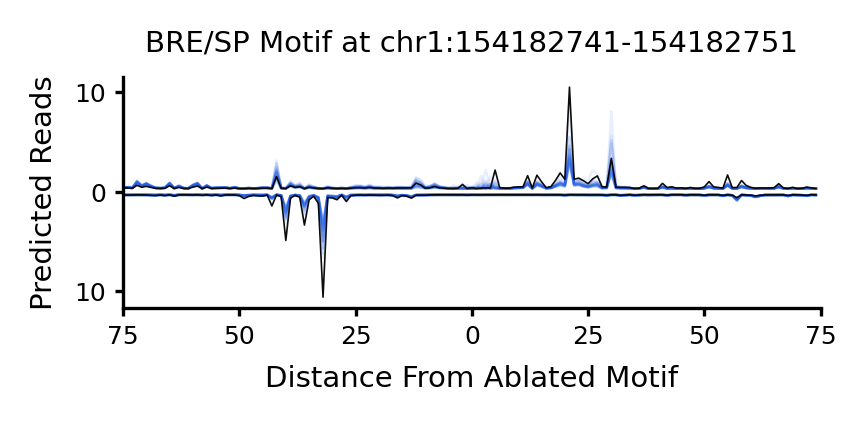

BRE/SP Example 7753
1192 1202


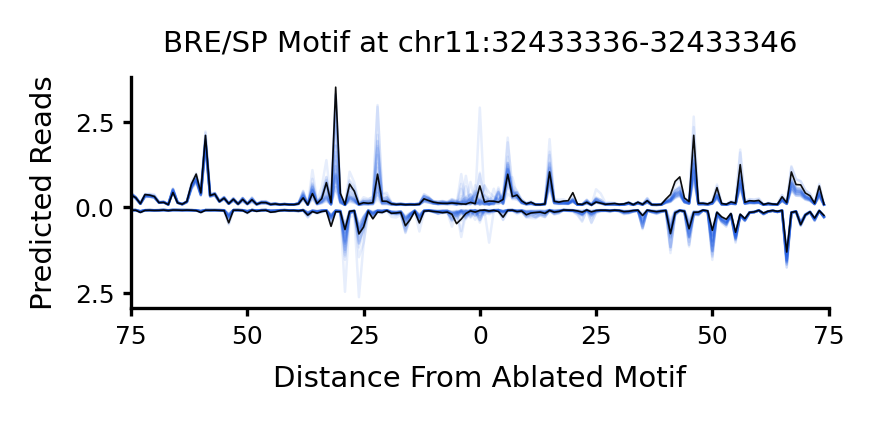

BRE/SP Example 12295
959 969


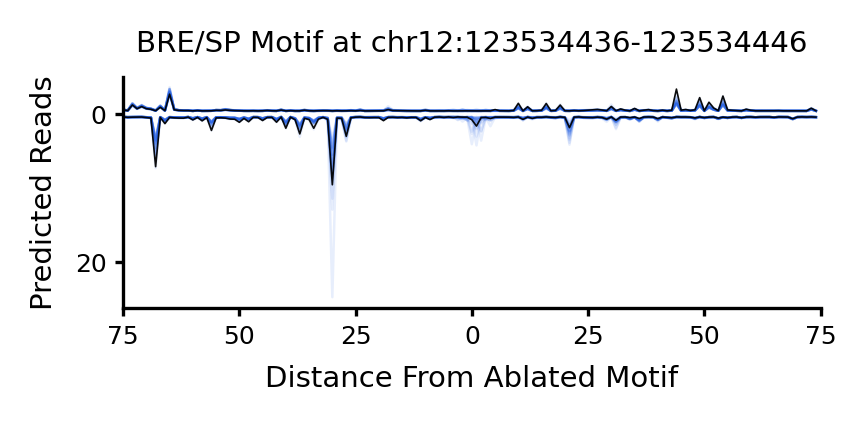

BRE/SP Example 40700
1048 1058


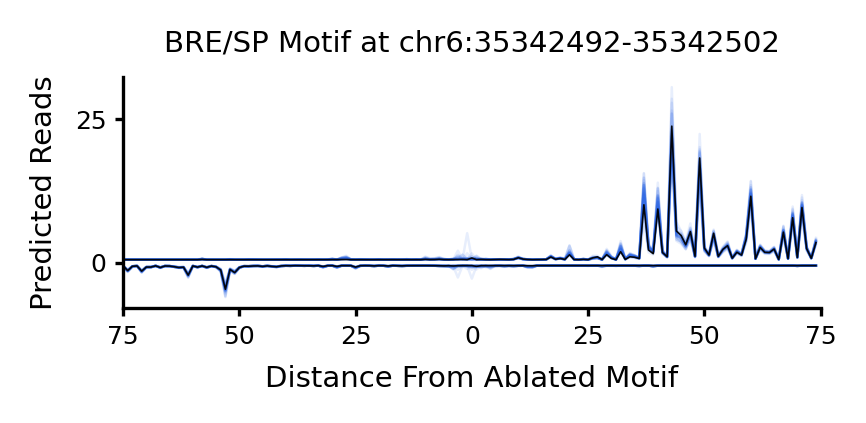

BRE/SP Example 19451
1069 1079


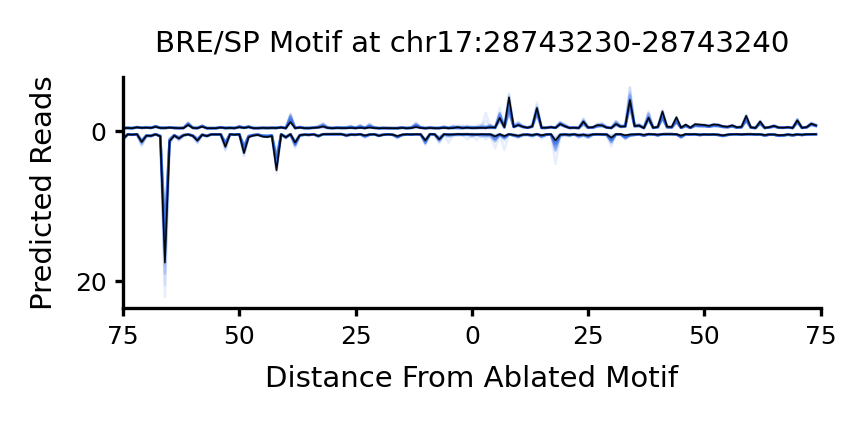

BRE/SP Example 43523
956 966


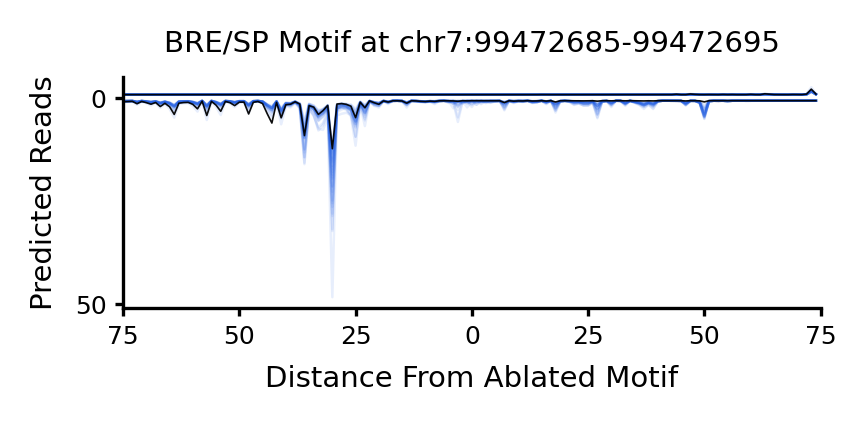

BRE/SP Example 312
1114 1124


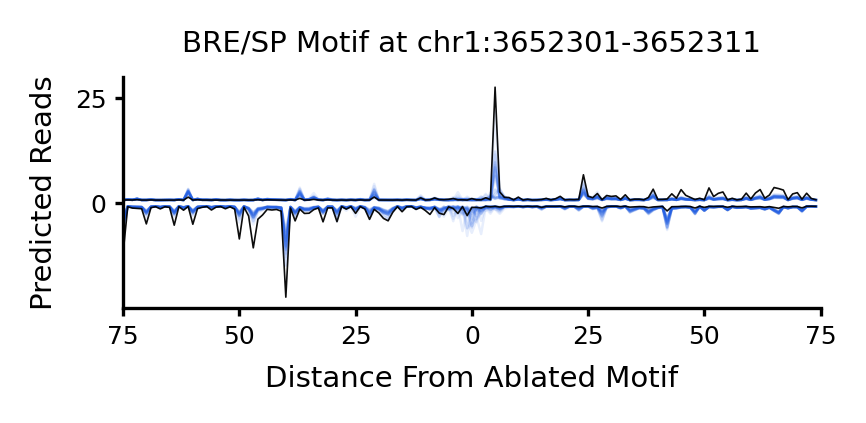

BRE/SP Example 21230
BRE/SP Example 943
BRE/SP Example 27304
1410 1420


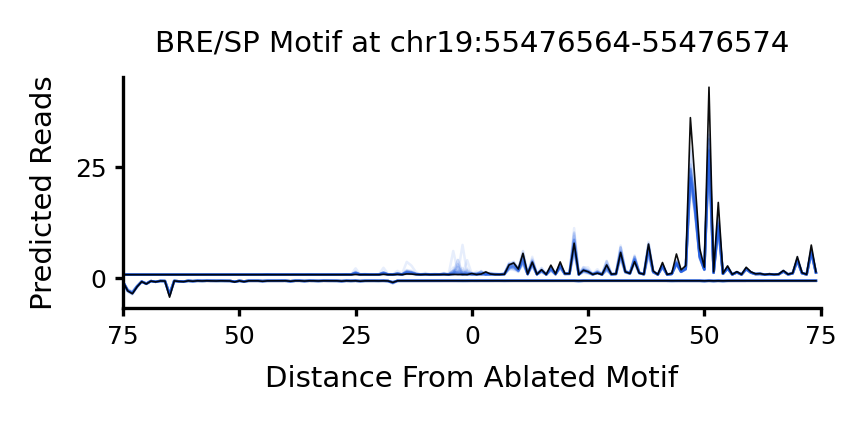



 ===== CA-Inr ===== 


CA-Inr Example 22870
CA-Inr Example 12097
1138 1142


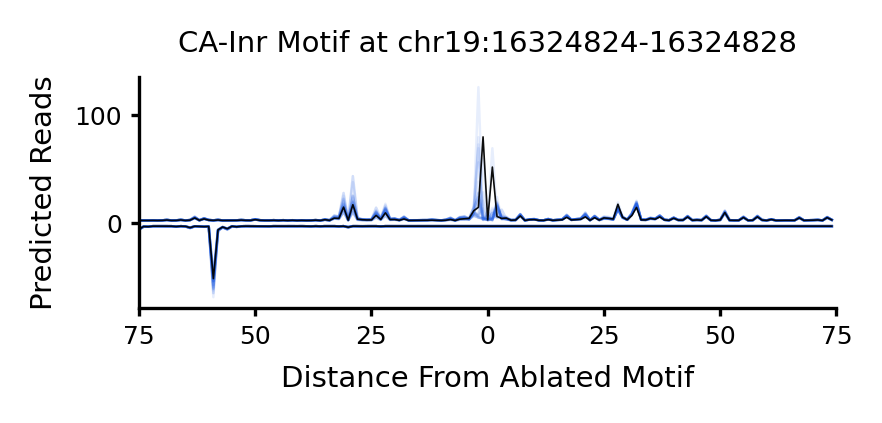

CA-Inr Example 10043
CA-Inr Example 5467
991 995


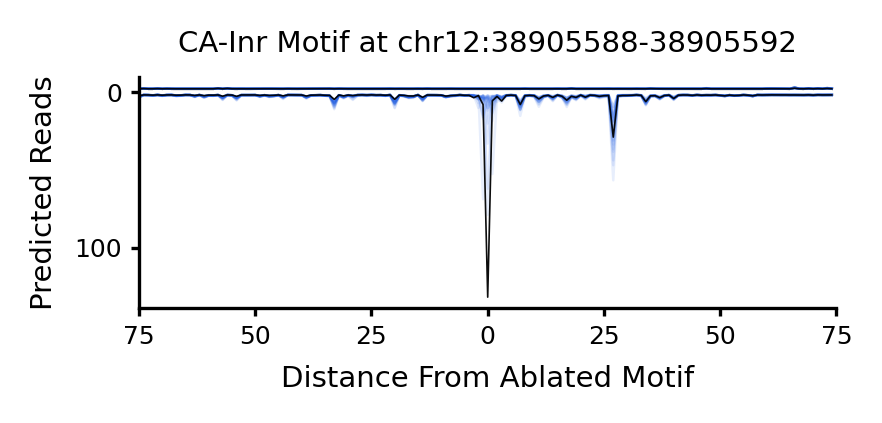

CA-Inr Example 20523
1332 1336


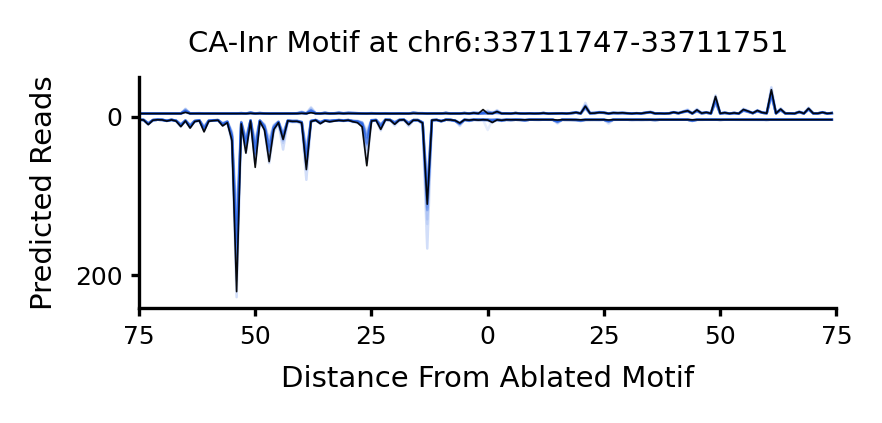

CA-Inr Example 21128
993 997


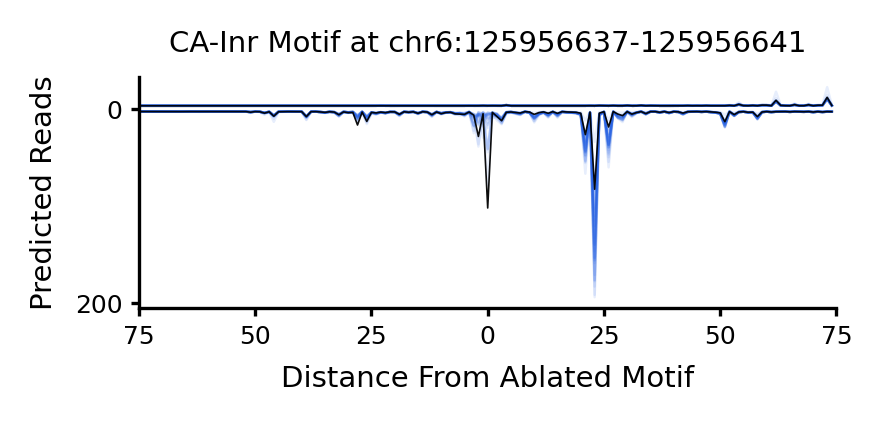

CA-Inr Example 17241
1011 1015


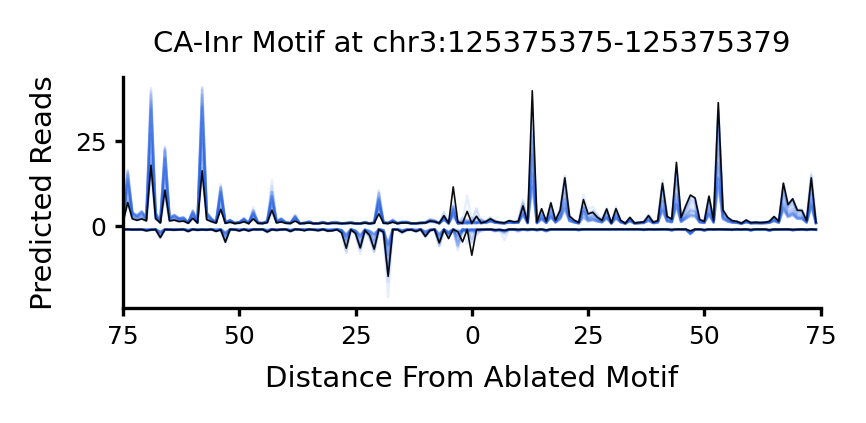

CA-Inr Example 13988
1168 1172


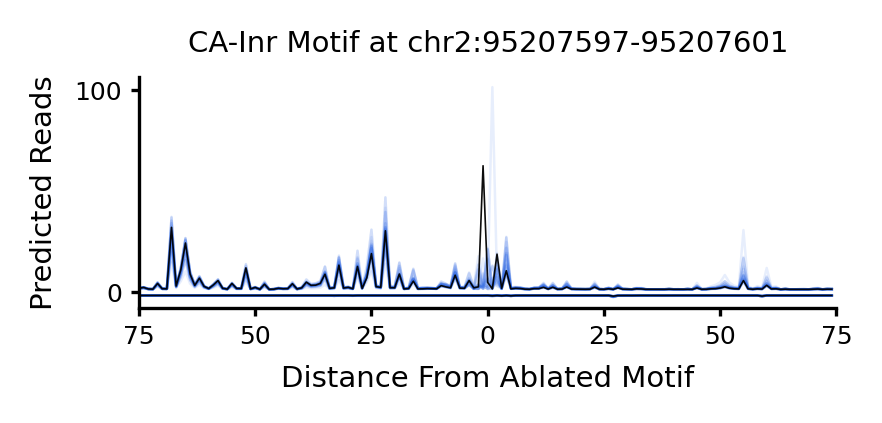

CA-Inr Example 15735
CA-Inr Example 20033


 ===== ETS ===== 


ETS Example 5896
1469 1478


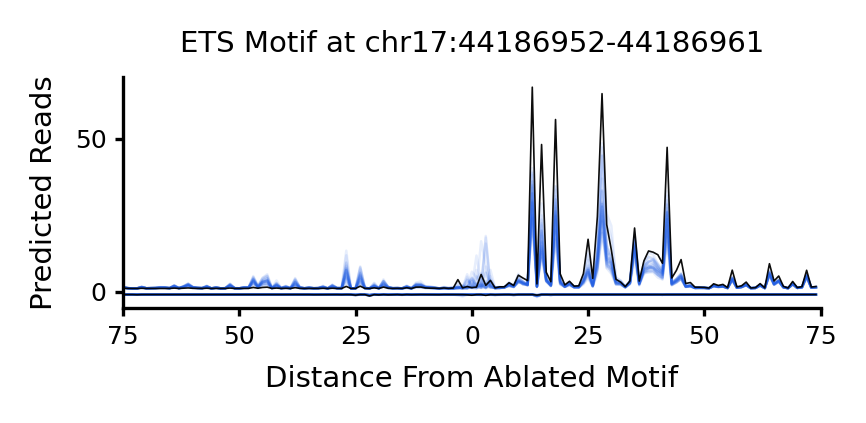

ETS Example 12740
999 1008


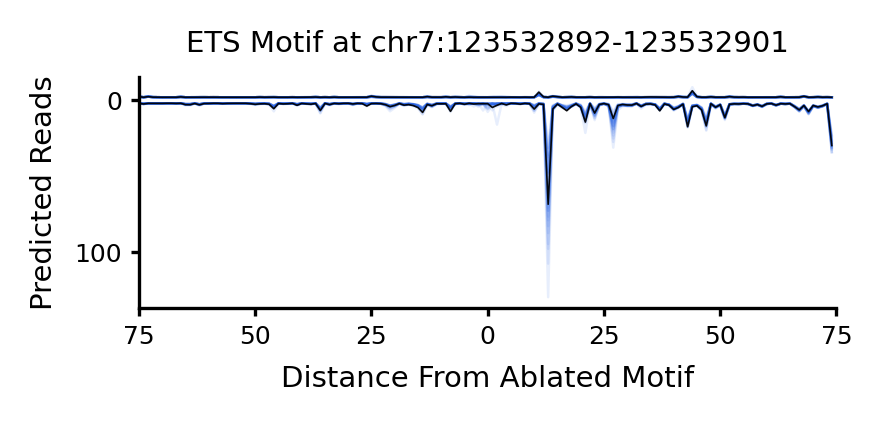

ETS Example 14144
1001 1010


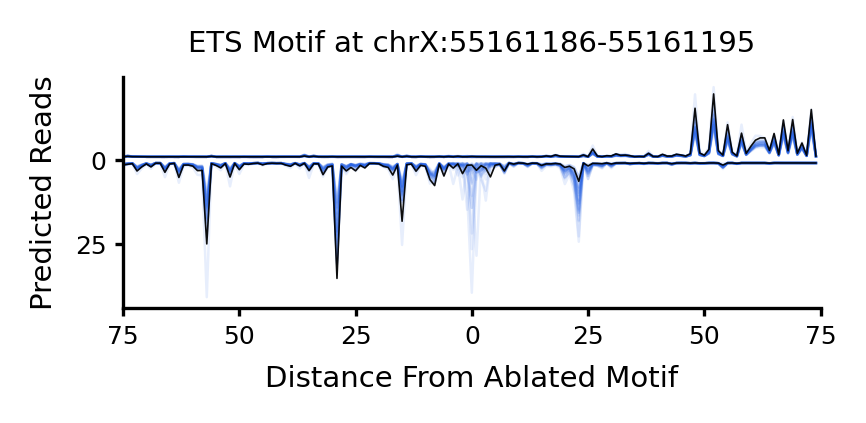

ETS Example 3138
1374 1383


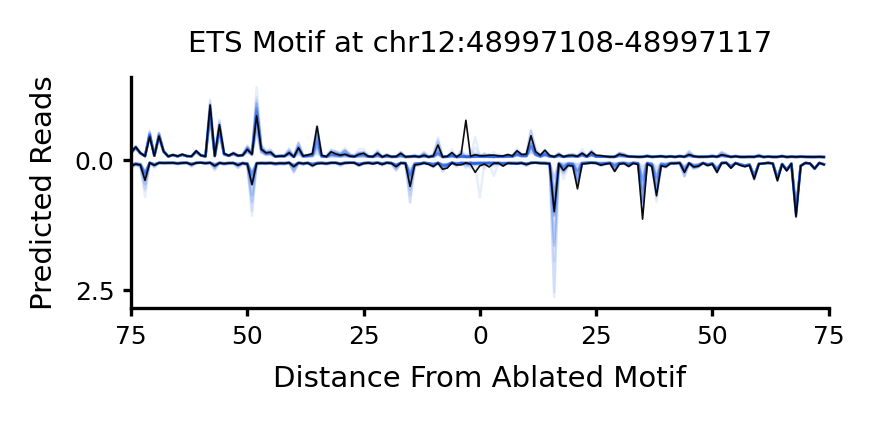

ETS Example 4109
1417 1426


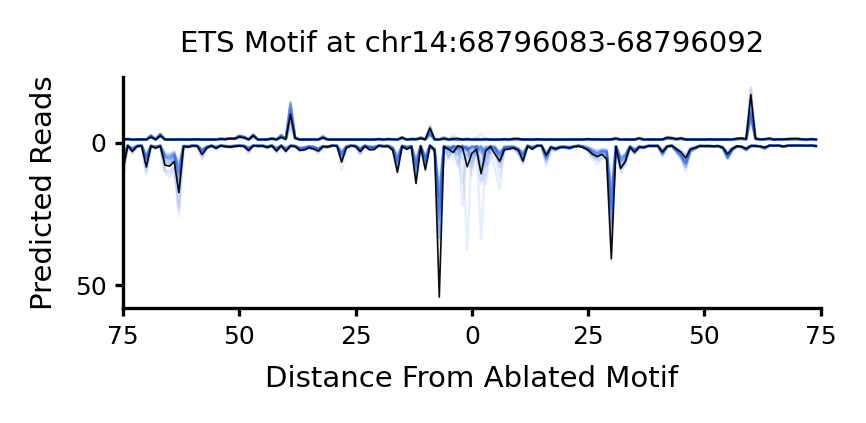

ETS Example 8
965 974


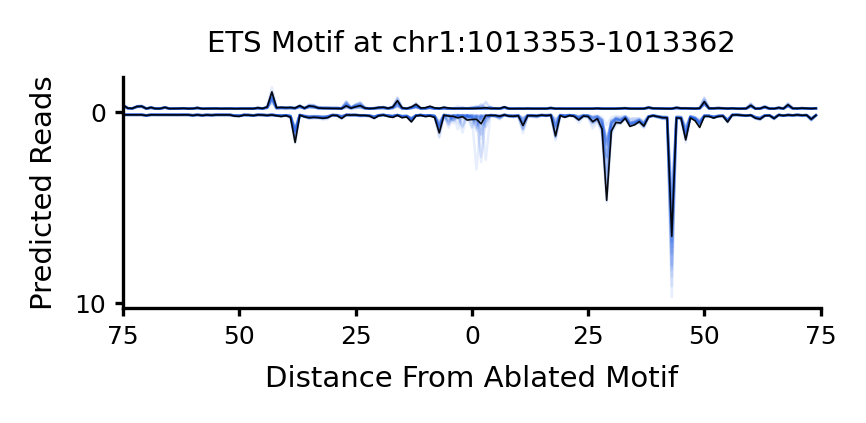

ETS Example 4699
1112 1121


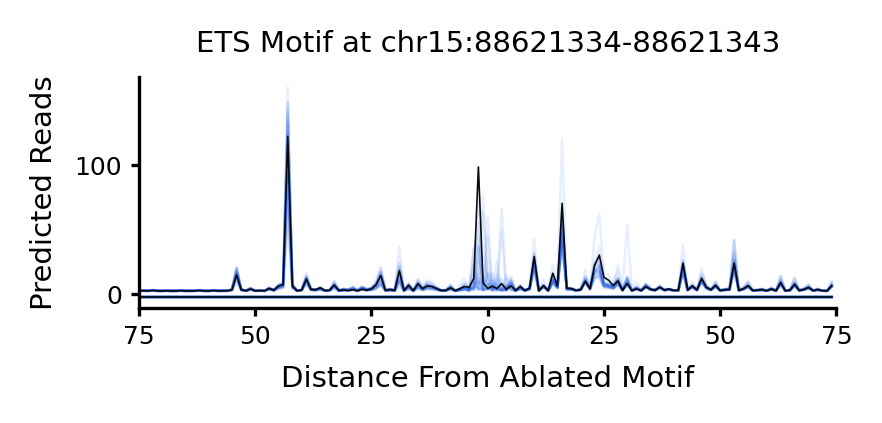

ETS Example 1242
1158 1167


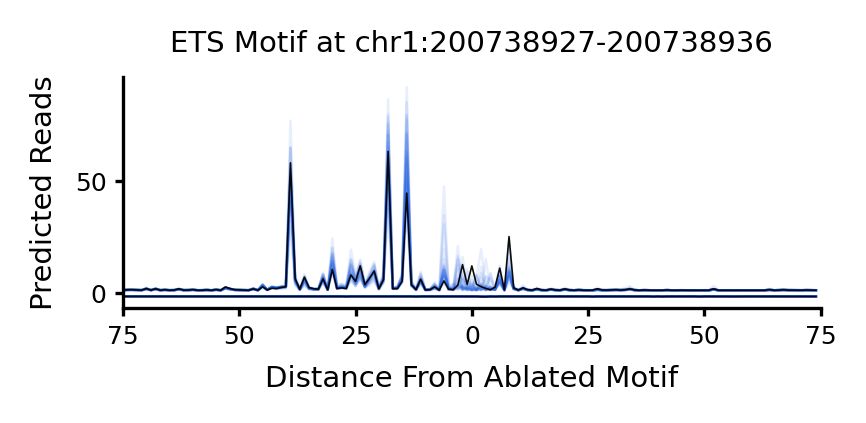

ETS Example 7311
730 739


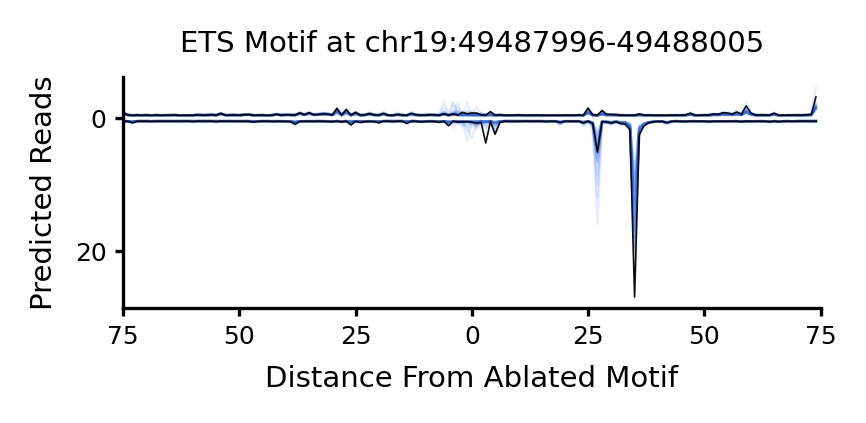

ETS Example 8093
1112 1121


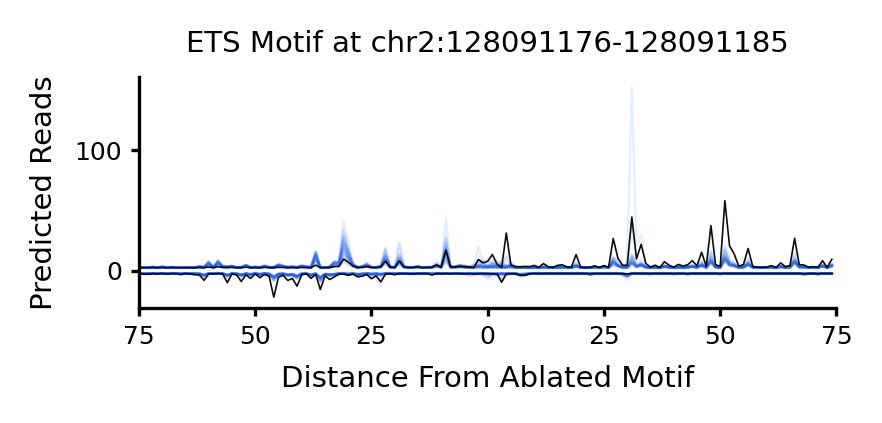



 ===== NFY ===== 


NFY Example 11903
1007 1012


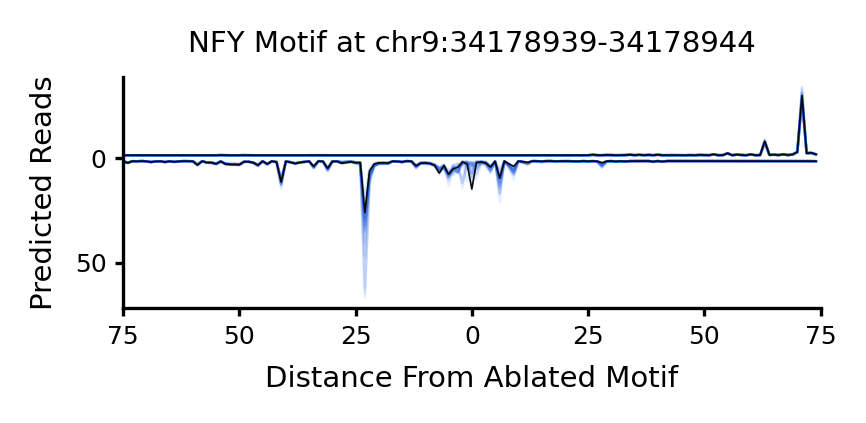

NFY Example 2204
1430 1435


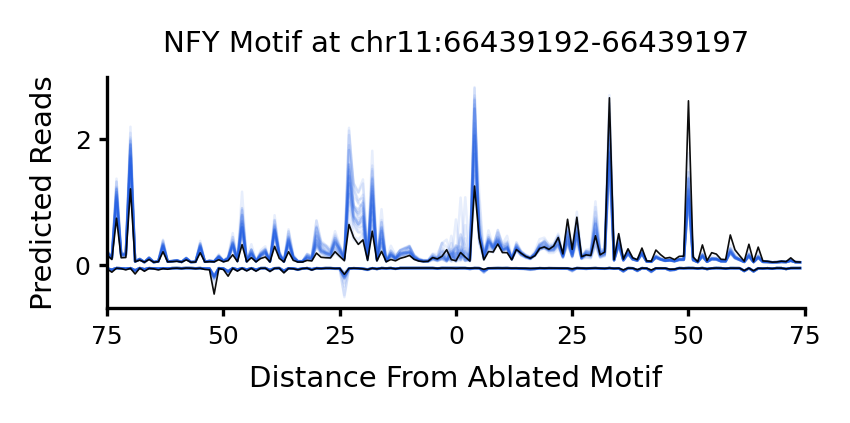

NFY Example 4515
805 810


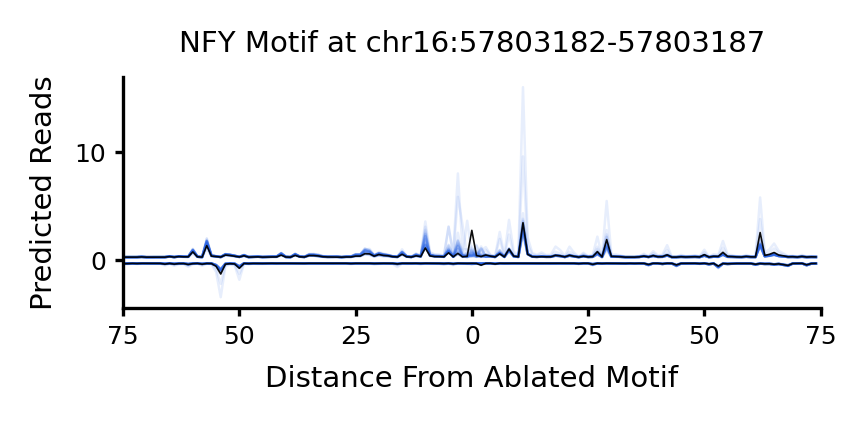

NFY Example 6338
1098 1103


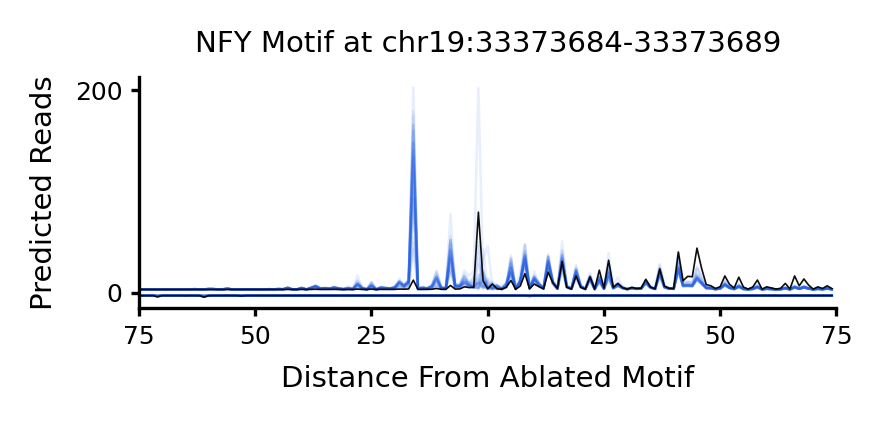

NFY Example 6956
697 702


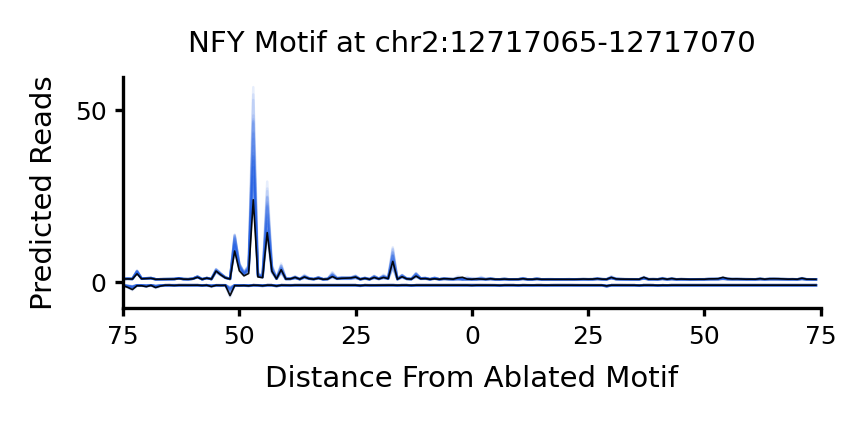

NFY Example 6143
1254 1259


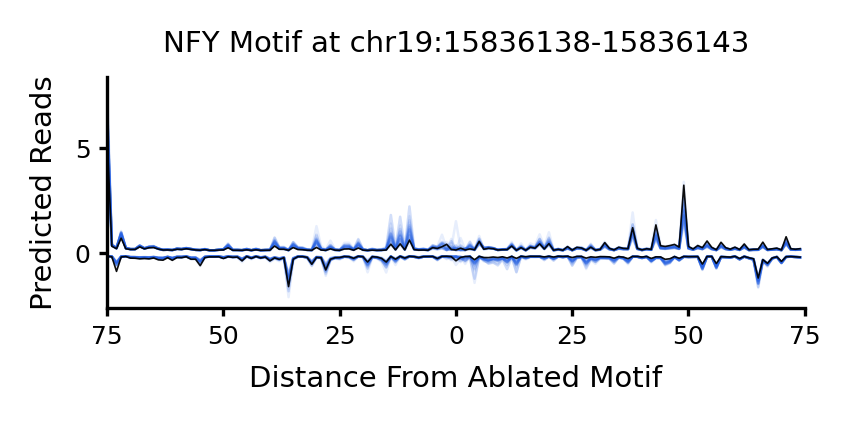

NFY Example 6187
1044 1049


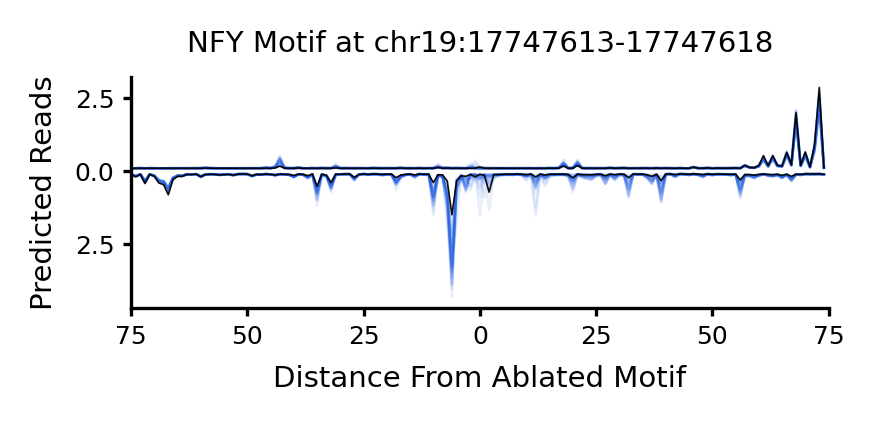

NFY Example 5496
1125 1130


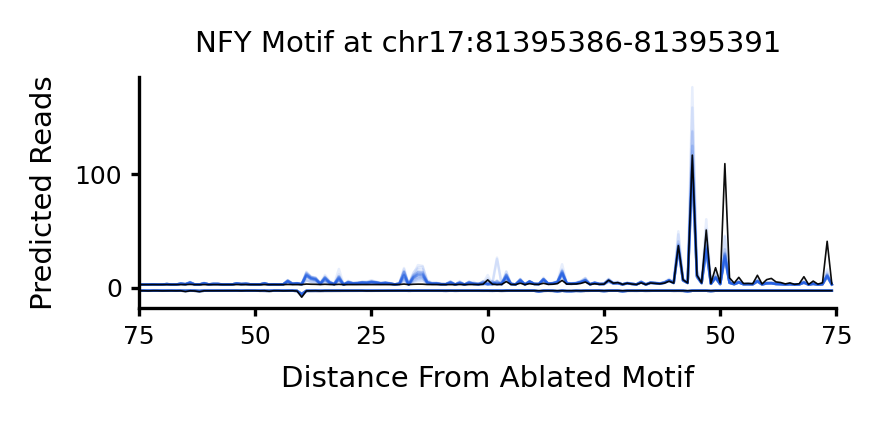

NFY Example 7570
792 797


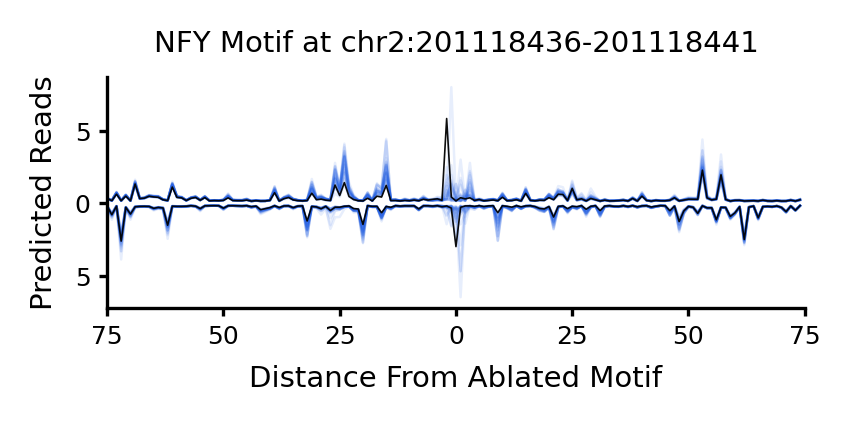

NFY Example 5823
1448 1453


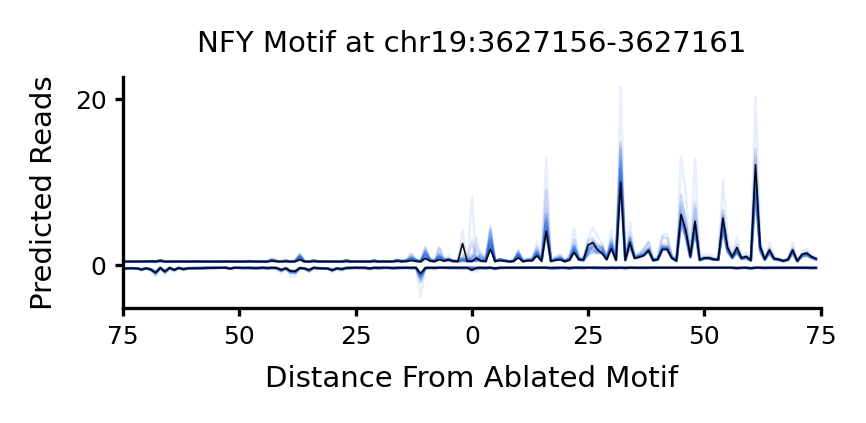



 ===== NRF1 ===== 


NRF1 Example 6753
978 991


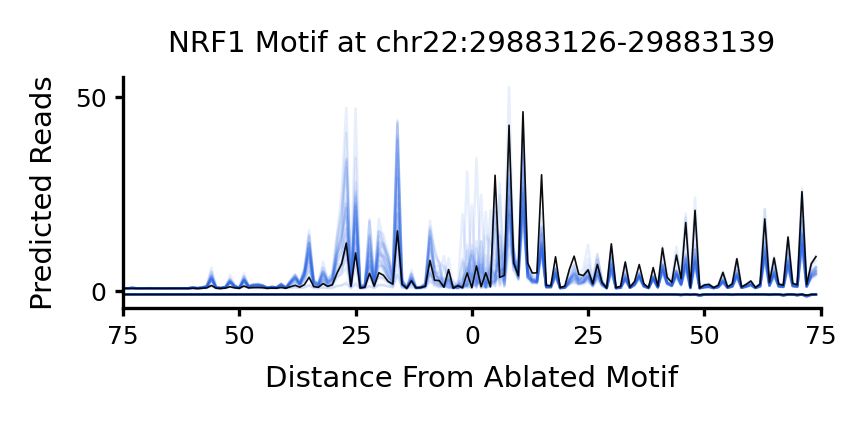

NRF1 Example 7846
1298 1311


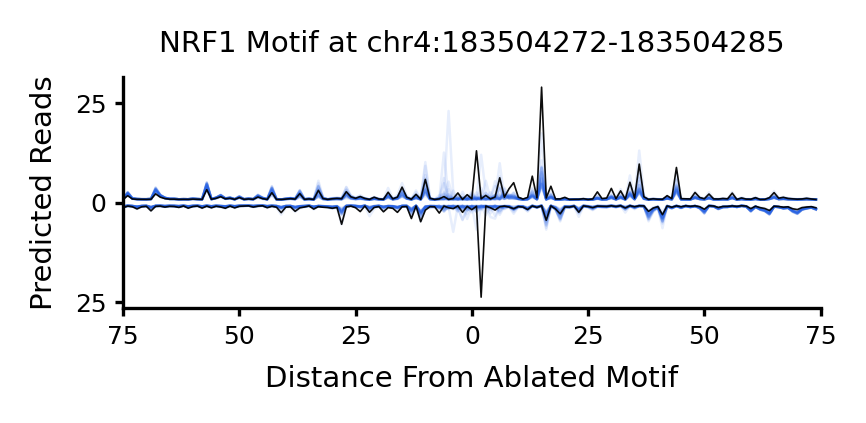

NRF1 Example 4395
1194 1207


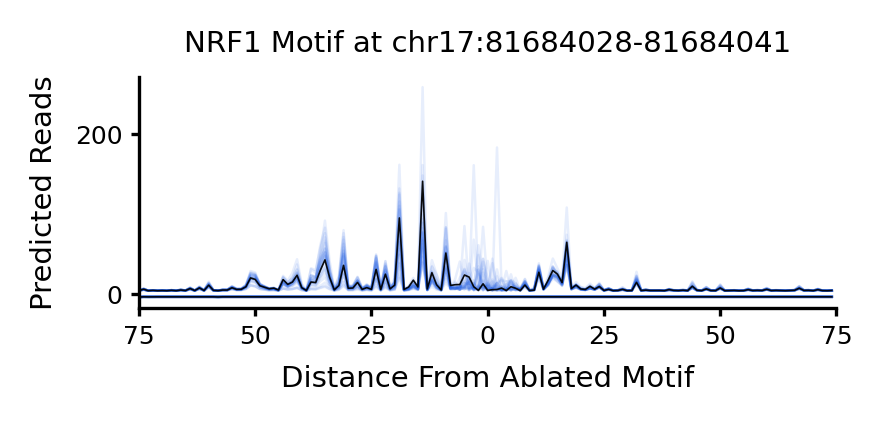

NRF1 Example 3415
1210 1223


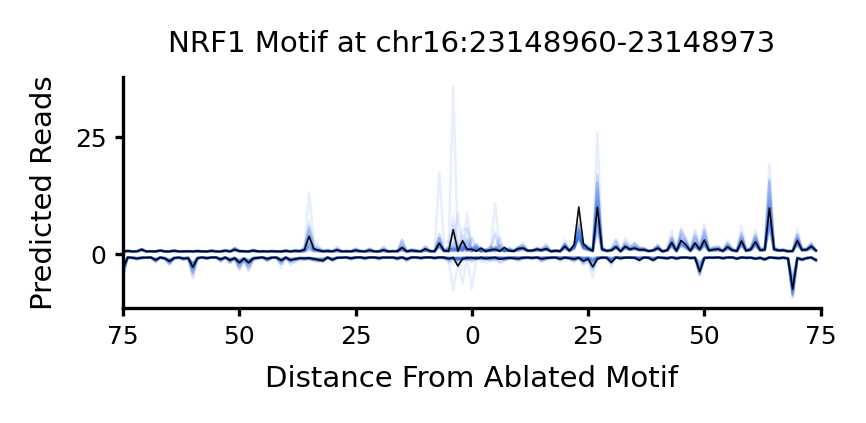

NRF1 Example 8146
999 1012


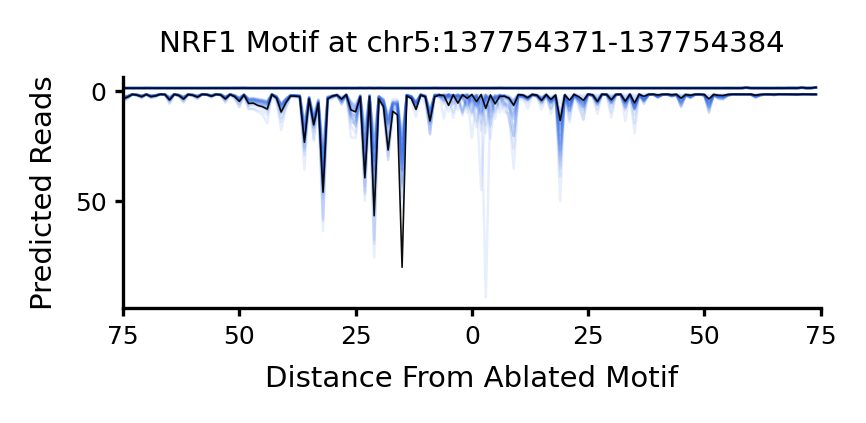

NRF1 Example 8938
1116 1129


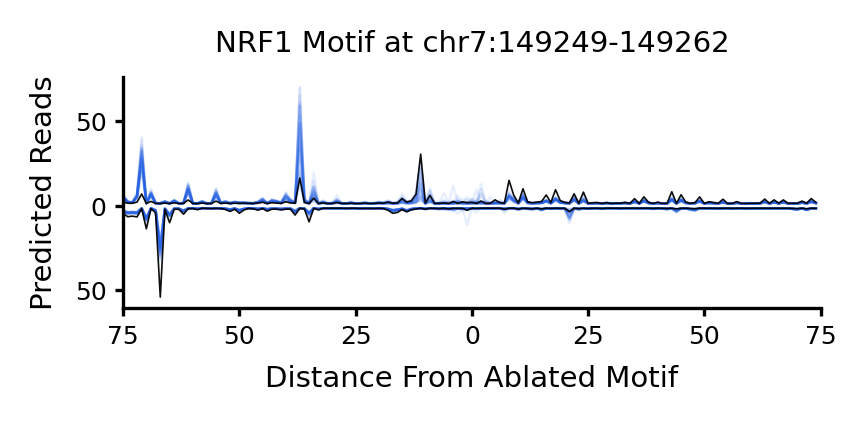

NRF1 Example 3994
1015 1028


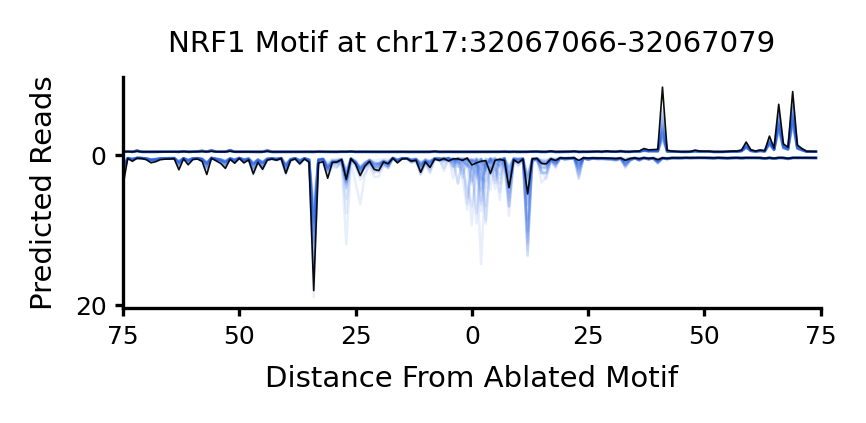

NRF1 Example 10003
1076 1089


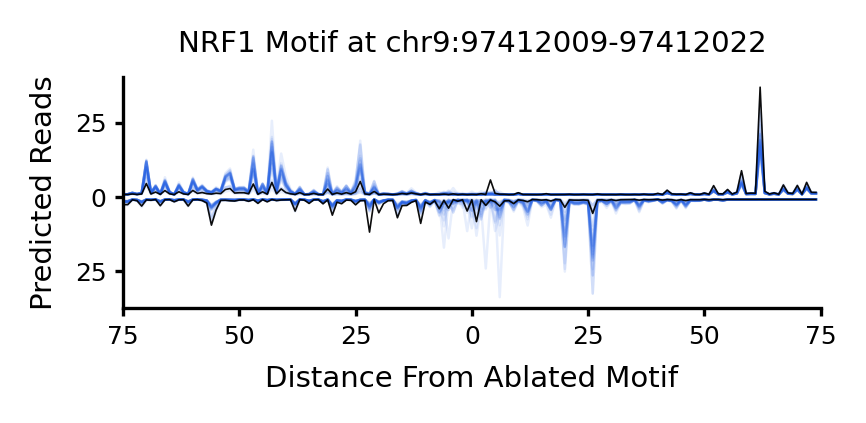

NRF1 Example 527
1354 1367


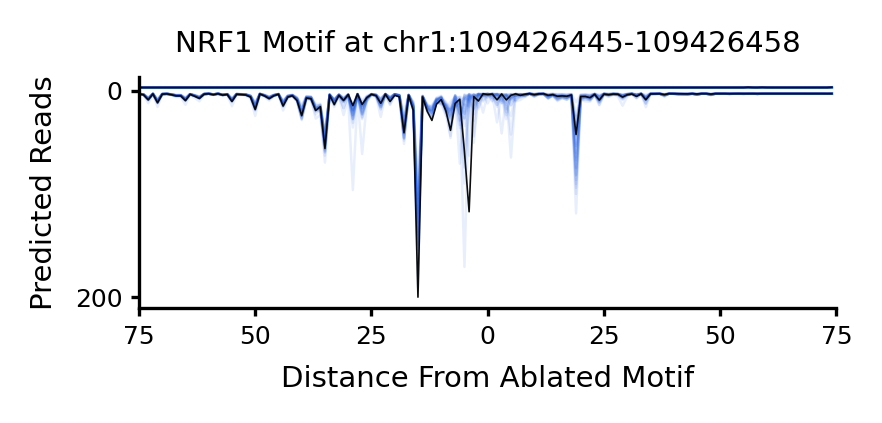

NRF1 Example 7424
1102 1115


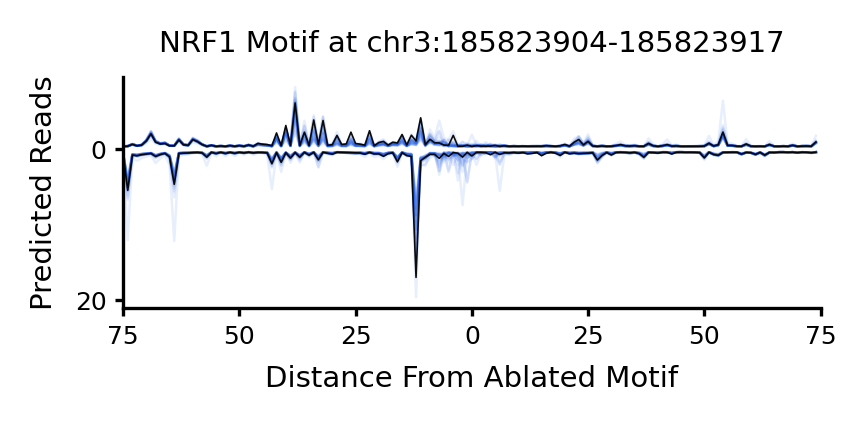



 ===== ATF1 ===== 


ATF1 Example 1091
1126 1135


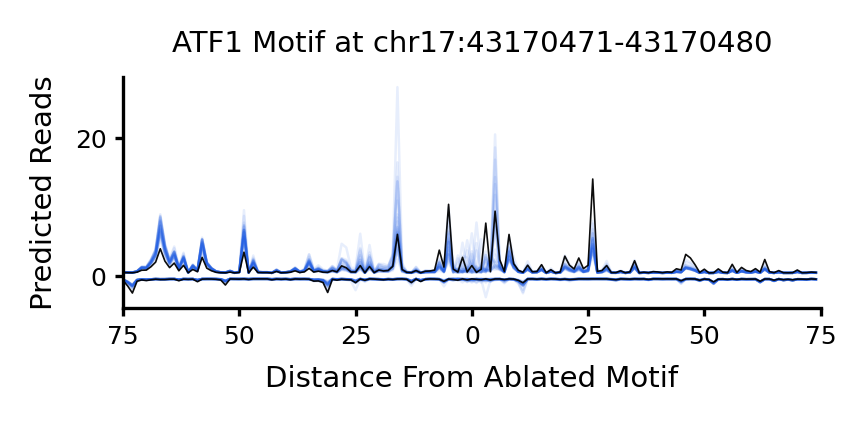

ATF1 Example 532
1117 1126


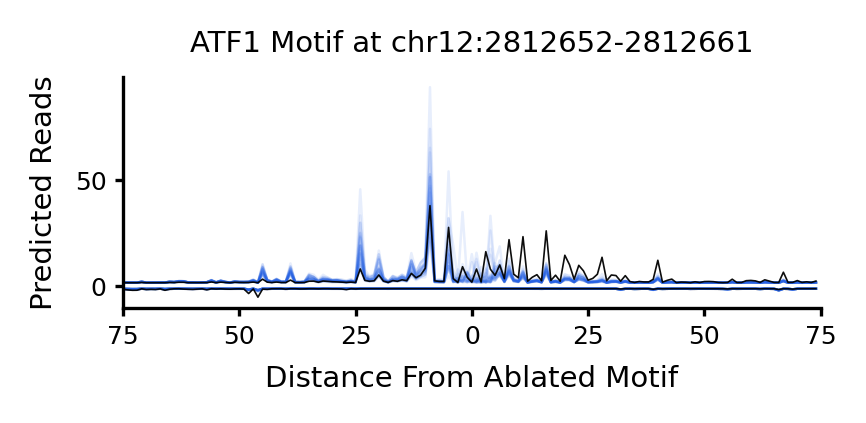

ATF1 Example 2337
ATF1 Example 97
1090 1099


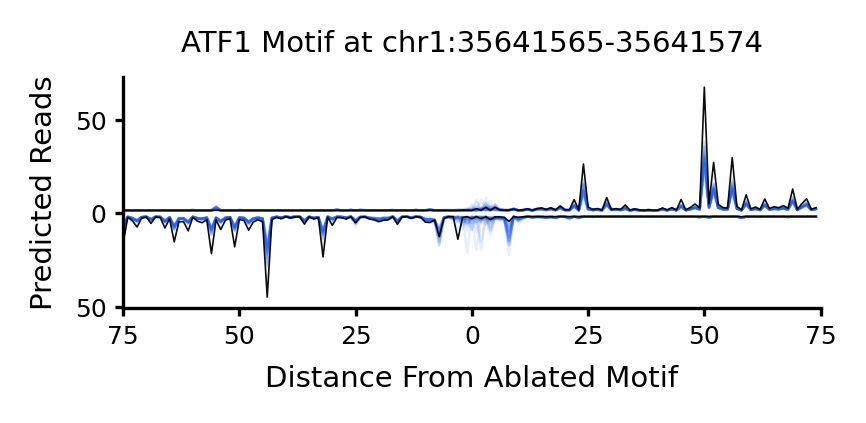

ATF1 Example 1338
1082 1091


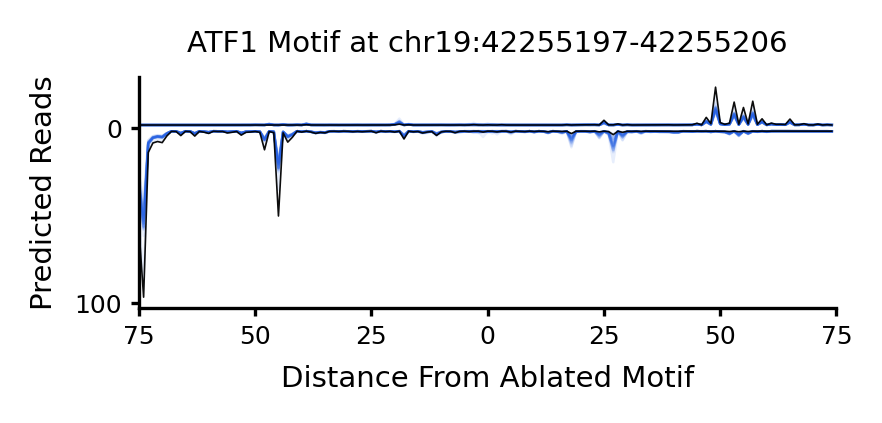

ATF1 Example 1482
ATF1 Example 1864
1144 1153


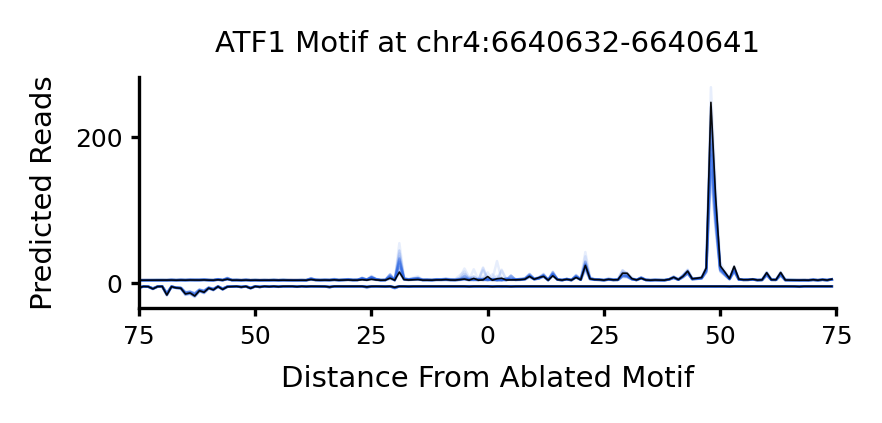

ATF1 Example 1662
1083 1092


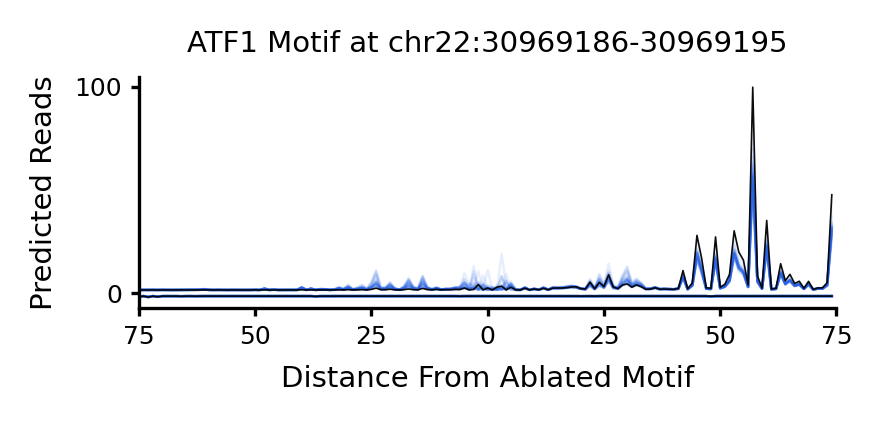

ATF1 Example 2452
ATF1 Example 1348
1036 1045


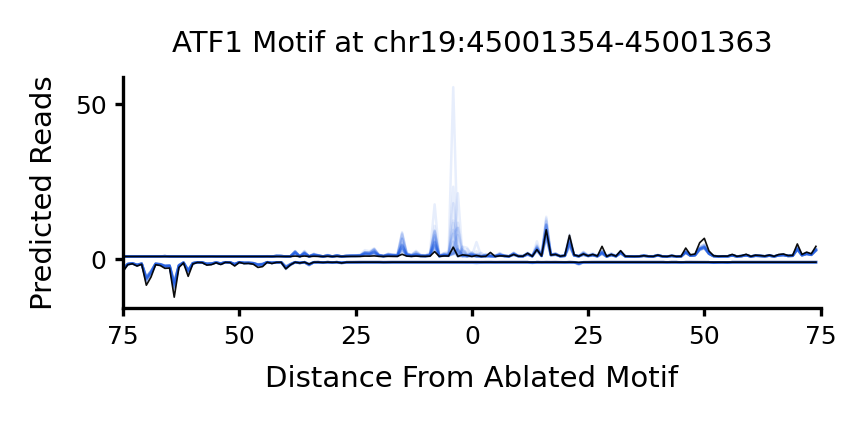



 ===== TATA ===== 


TATA Example 2856
TATA Example 126
TATA Example 1015
1173 1179


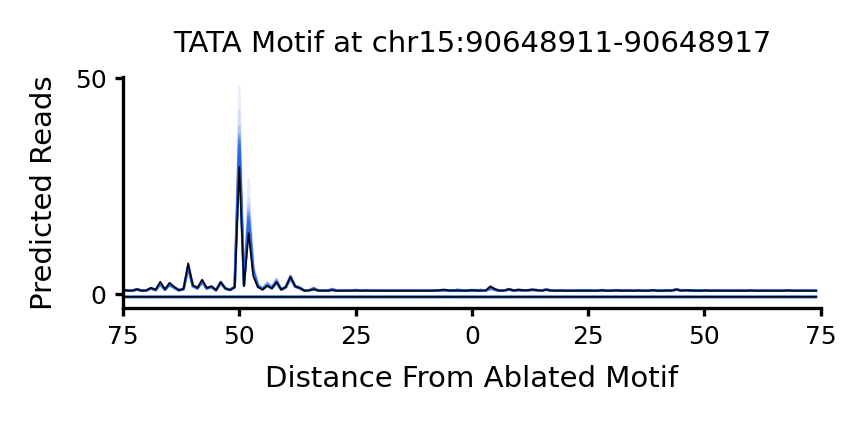

TATA Example 2108
TATA Example 2192
TATA Example 1474
1104 1110


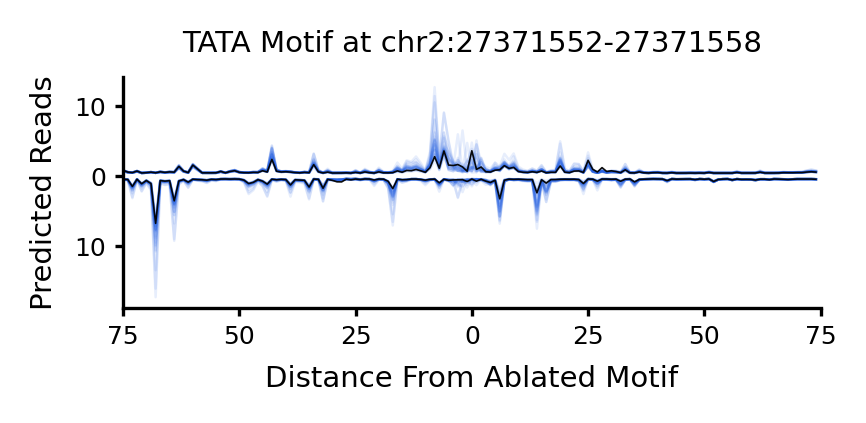

TATA Example 1954
1022 1028


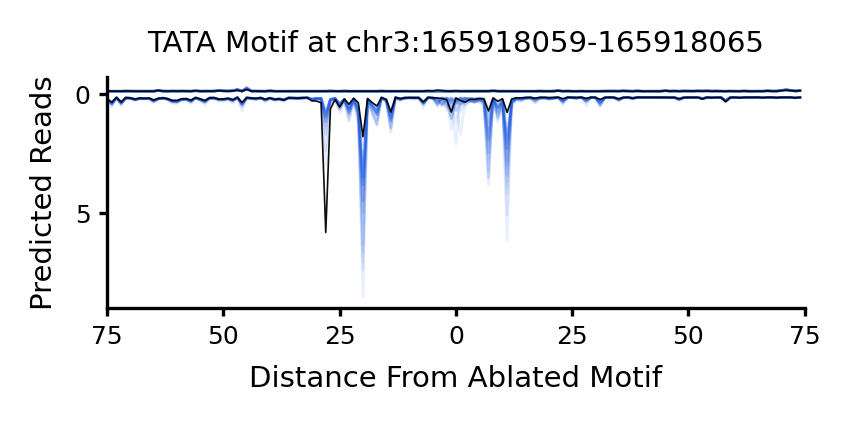

TATA Example 2078
TATA Example 3096
824 830


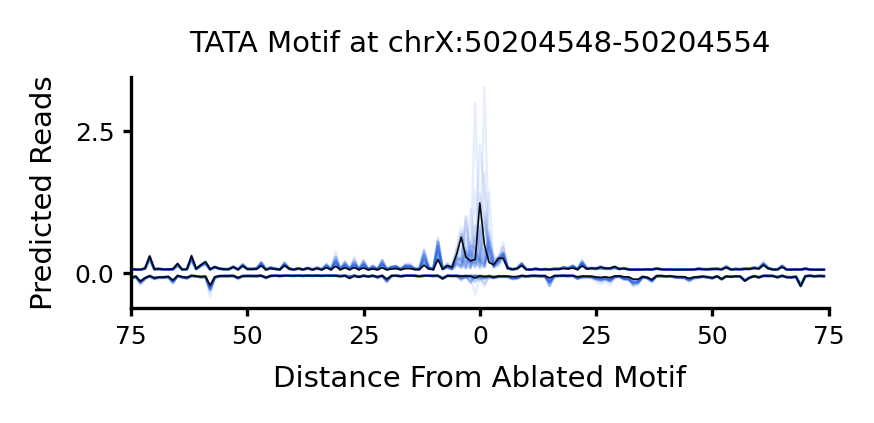

TATA Example 1308
1229 1235


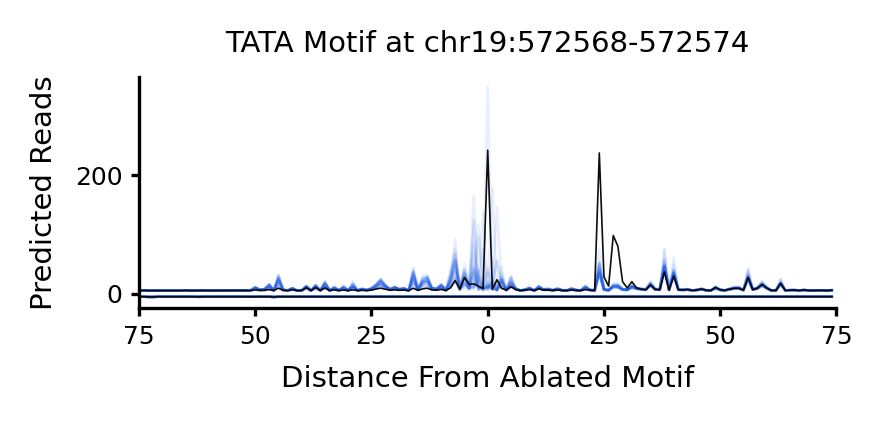



 ===== THAP11 ===== 


THAP11 Example 734
1089 1111


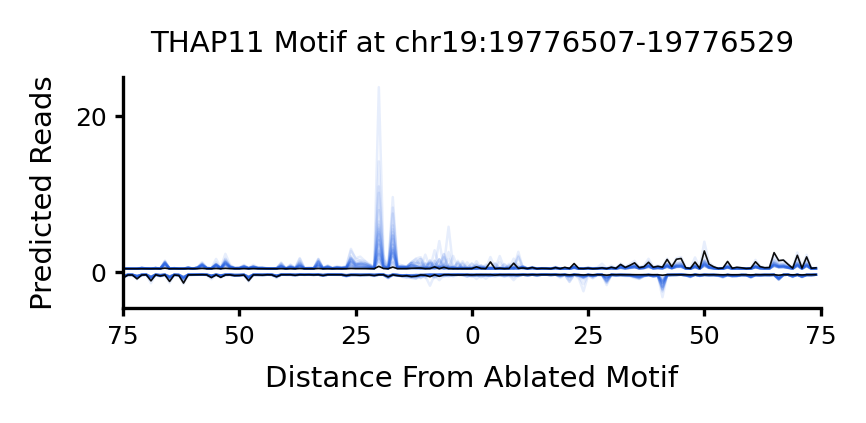

THAP11 Example 1487
1378 1400


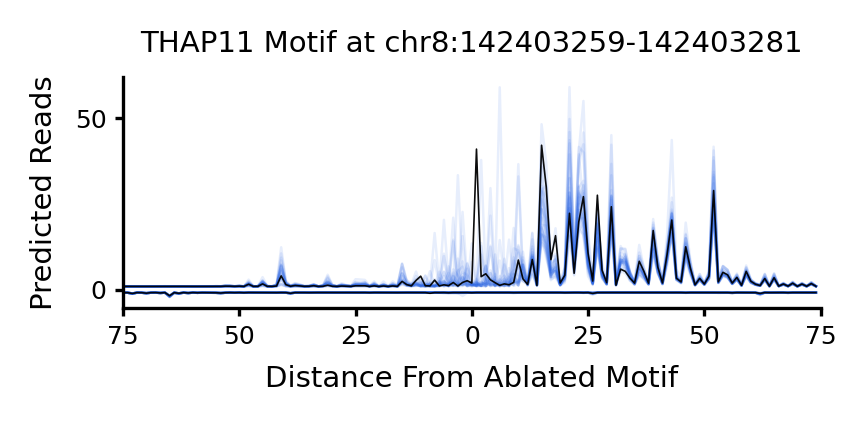

THAP11 Example 1266
1106 1128


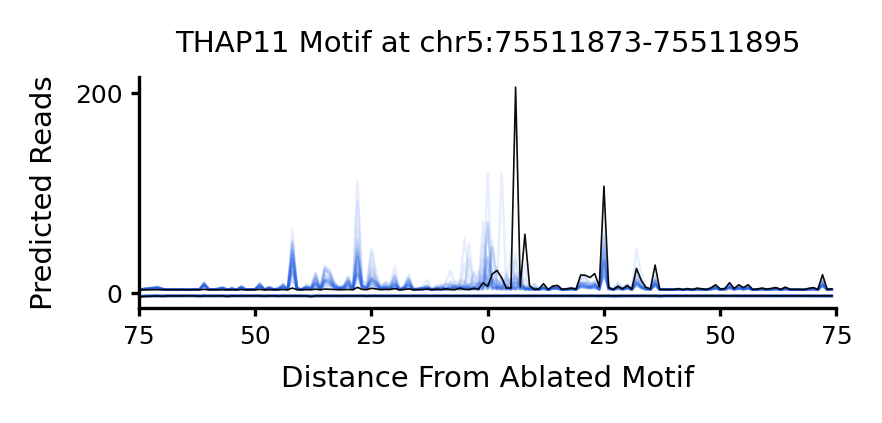

THAP11 Example 810
1050 1072


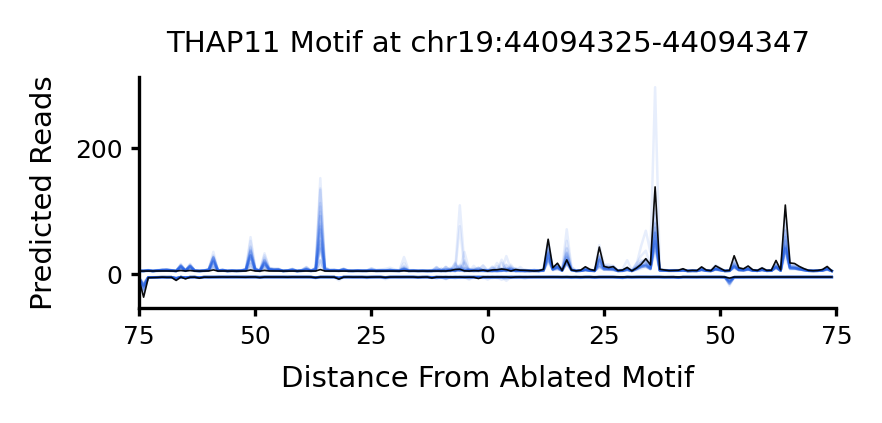

THAP11 Example 462
971 993


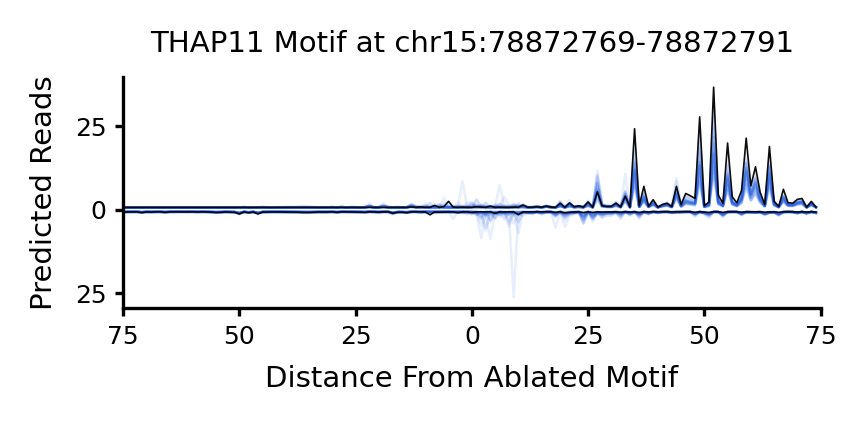

THAP11 Example 843
1327 1349


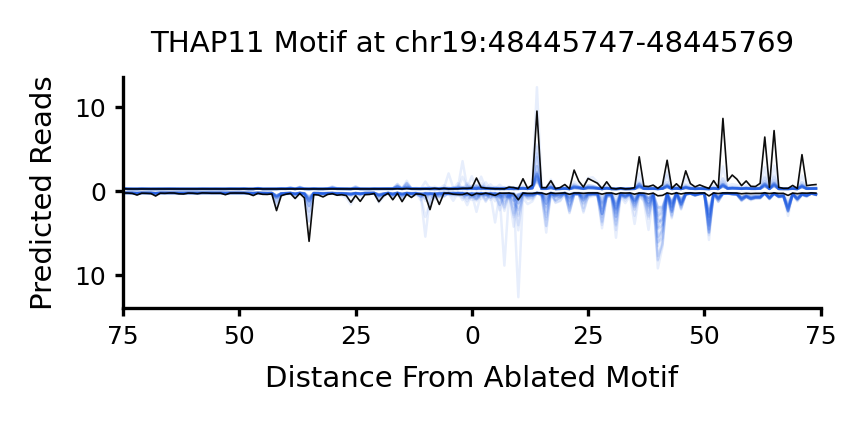

THAP11 Example 739
1146 1168


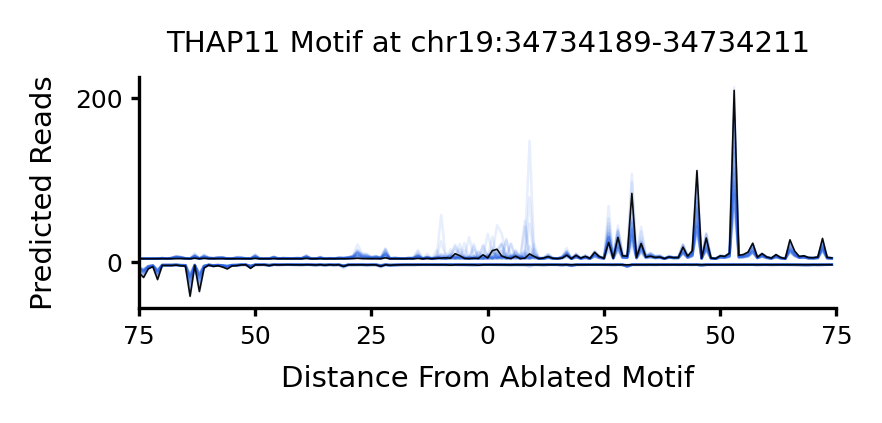

THAP11 Example 1408
1062 1084


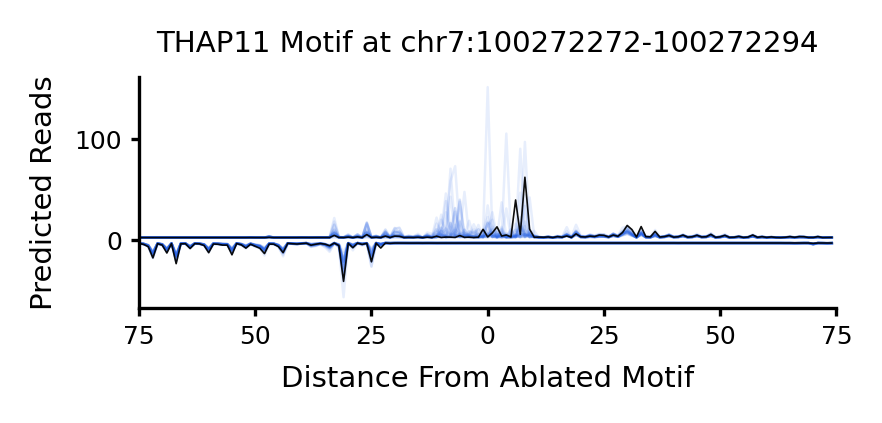

THAP11 Example 1184
1092 1114


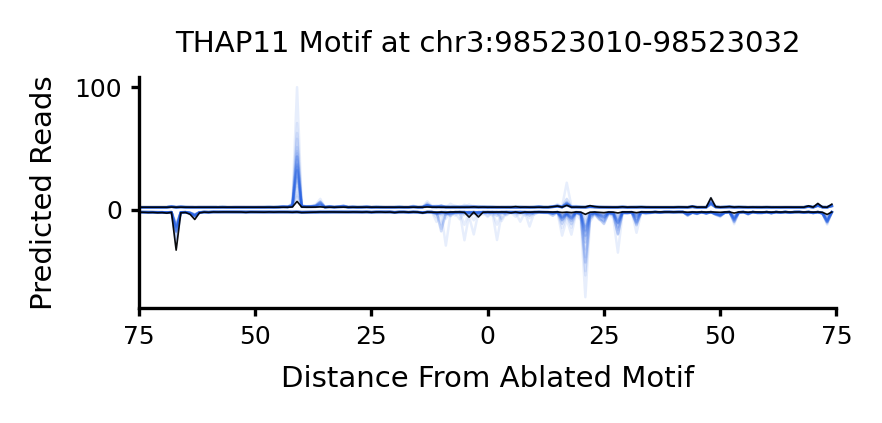

THAP11 Example 1201
967 989


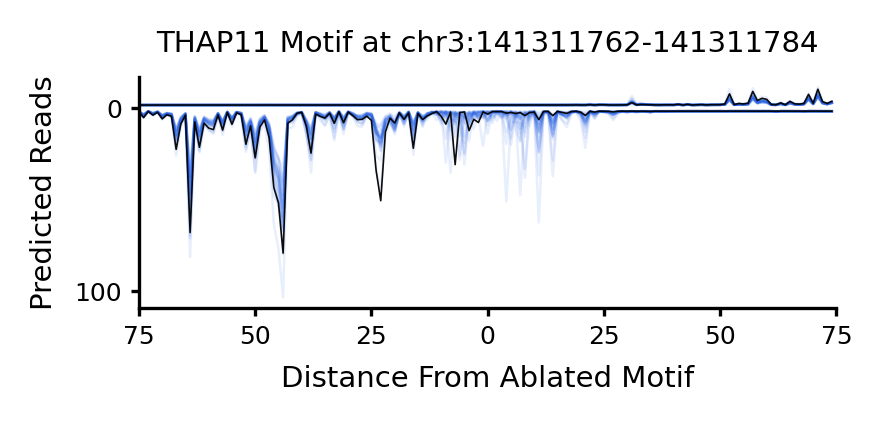



 ===== YY1 ===== 


YY1 Example 39
1023 1038


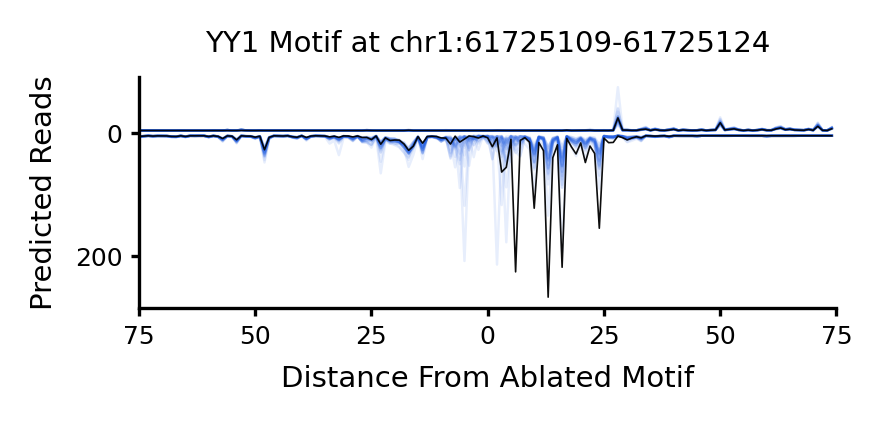

YY1 Example 163
1100 1115


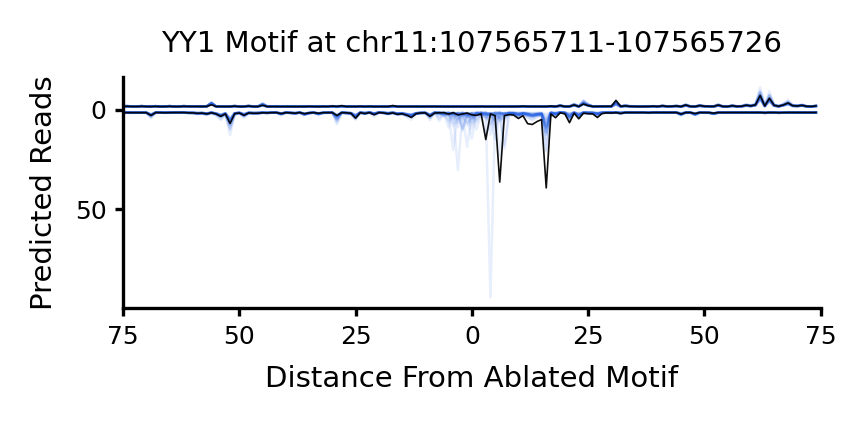

YY1 Example 40
1326 1341


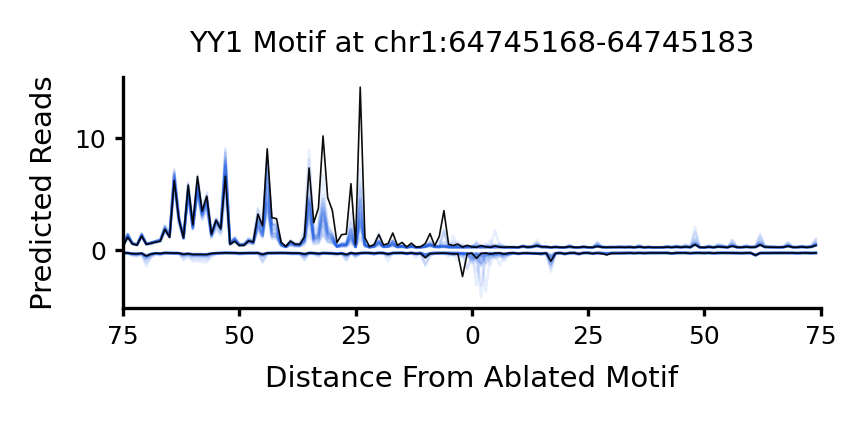

YY1 Example 667
830 845


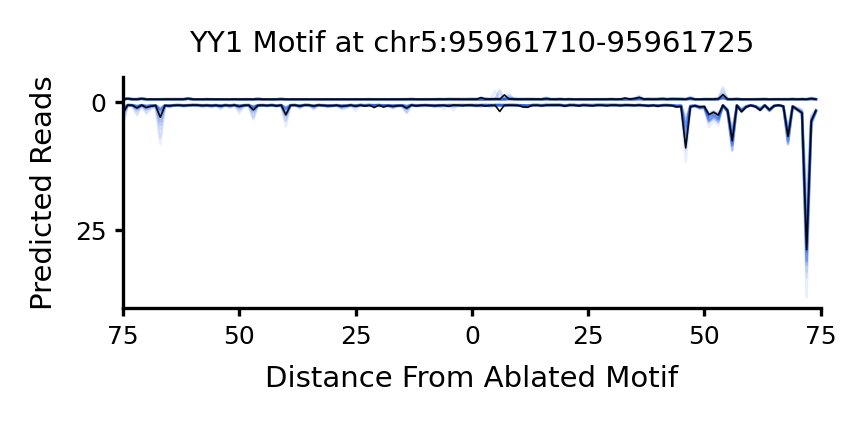

YY1 Example 596
1043 1058


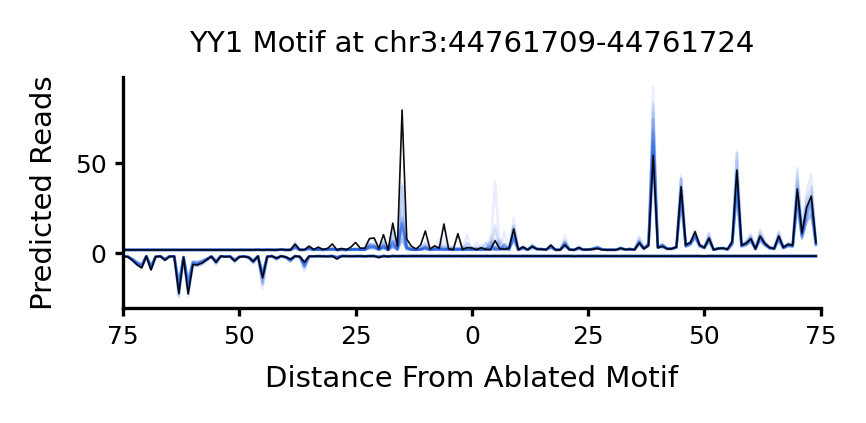

YY1 Example 349
1013 1028


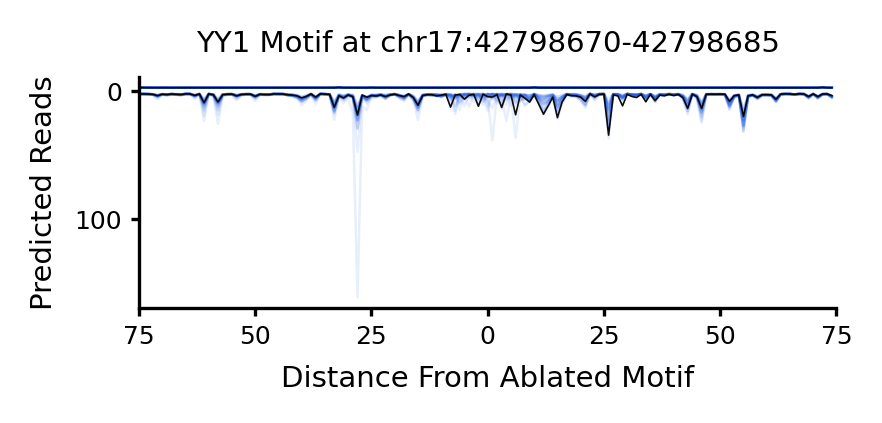

YY1 Example 183
887 902


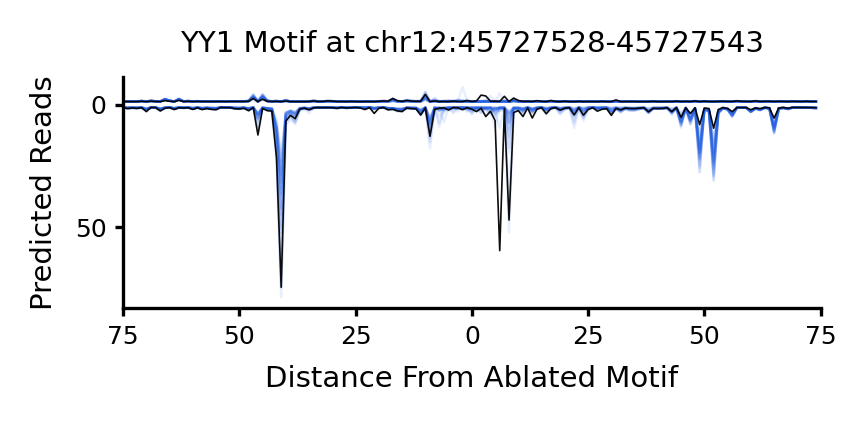

YY1 Example 396
1461 1476


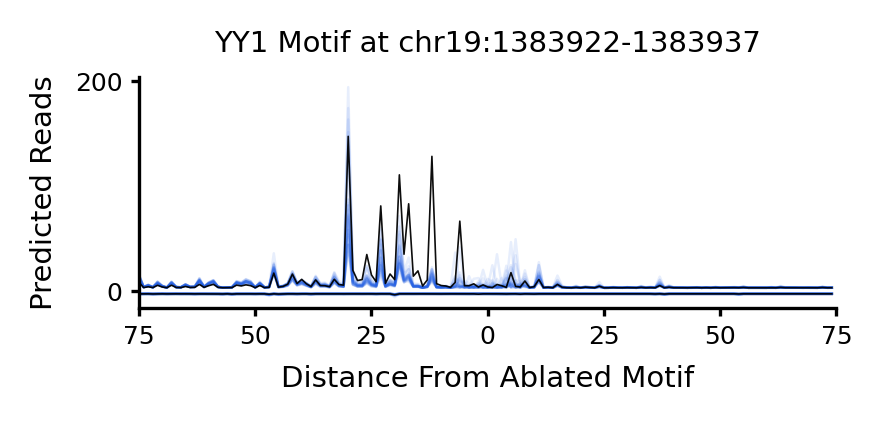

YY1 Example 701
1545 1560


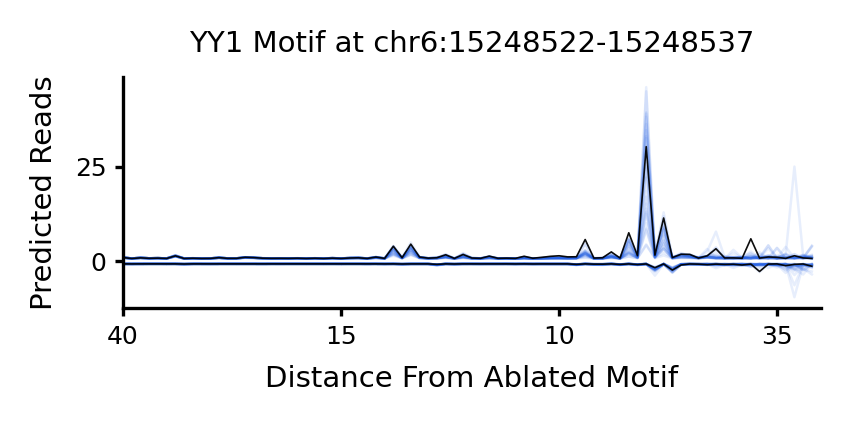

YY1 Example 790
952 967


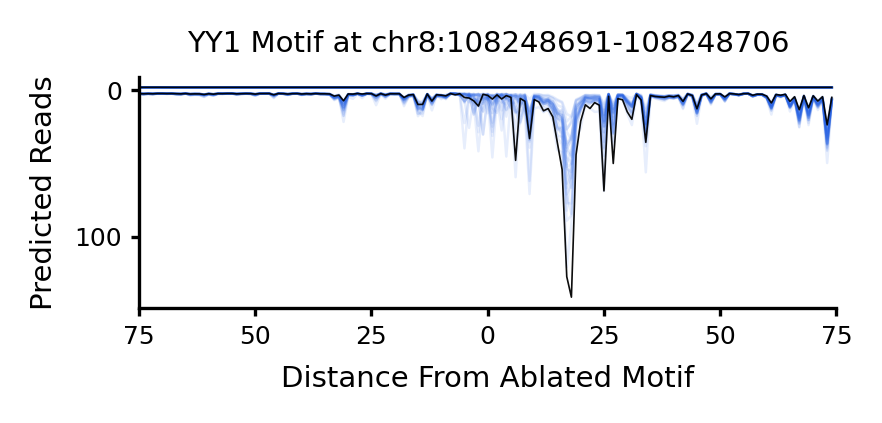



 ===== AP1 ===== 


AP1 Example 2530
1317 1324


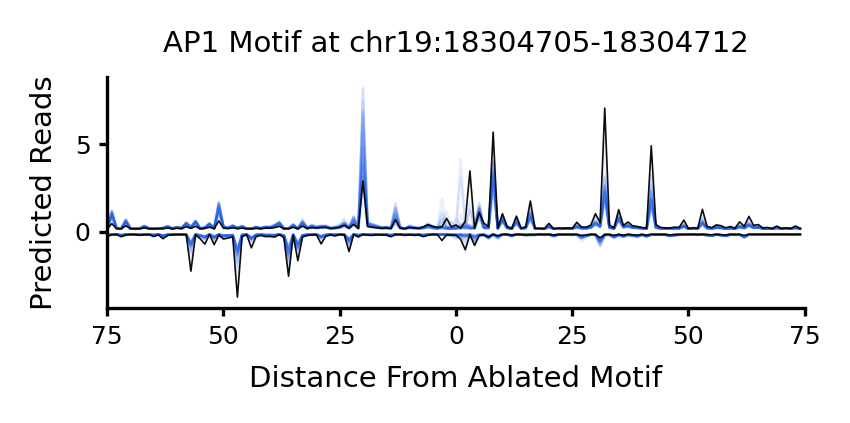

AP1 Example 3287
AP1 Example 3355
1159 1166


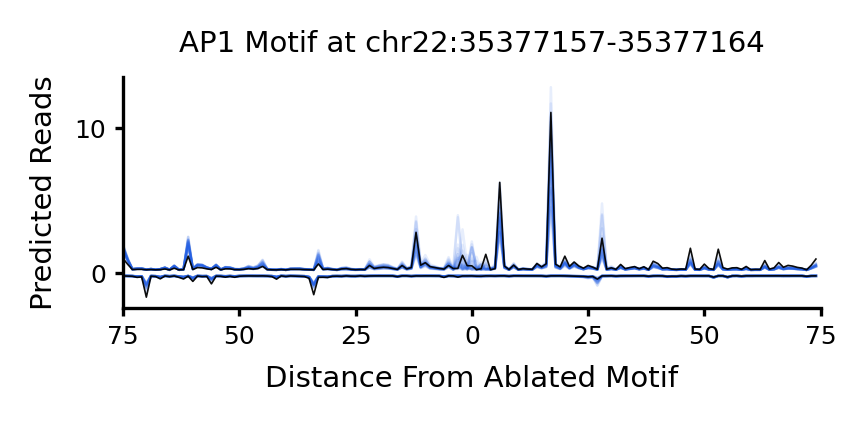

AP1 Example 1788
AP1 Example 4041
722 729


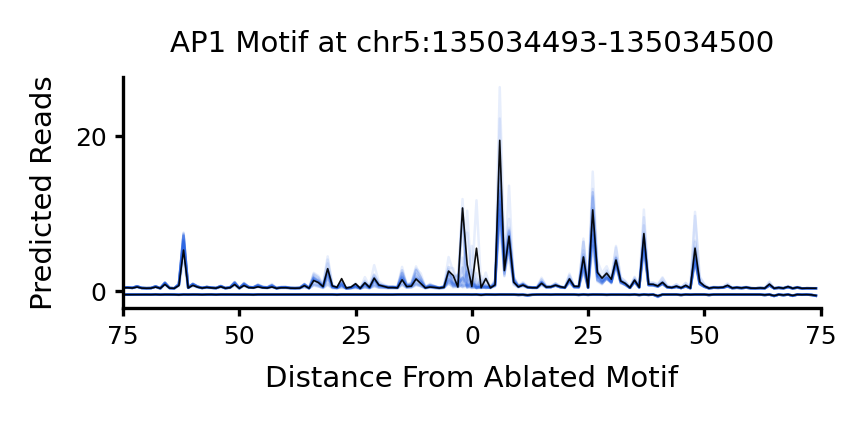

AP1 Example 2727
849 856


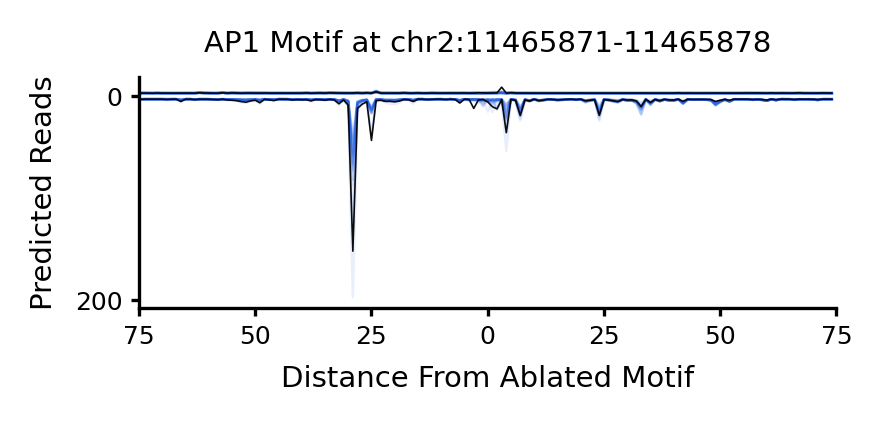

AP1 Example 5109
1174 1181


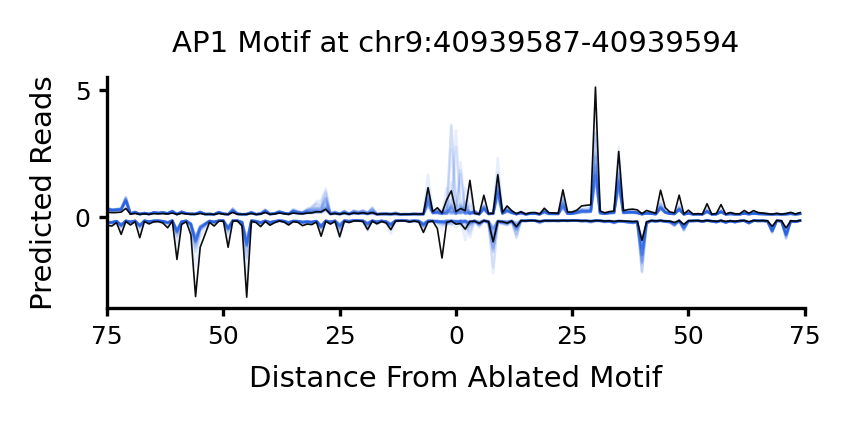

AP1 Example 7
1241 1248


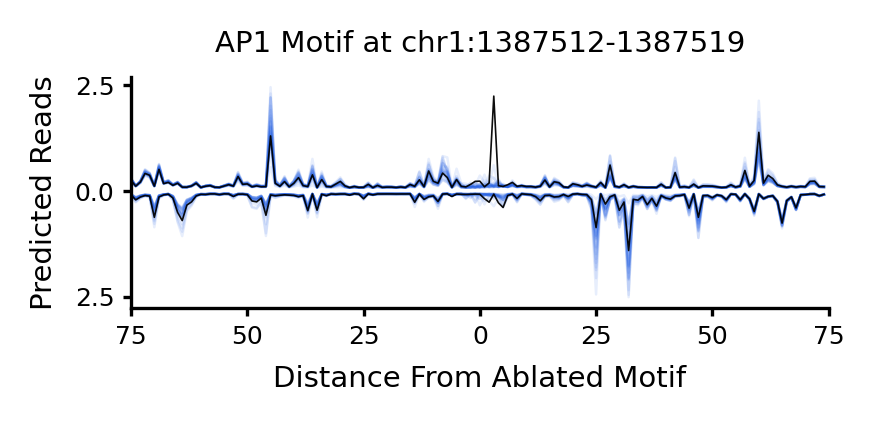

AP1 Example 4639
AP1 Example 1338
998 1005


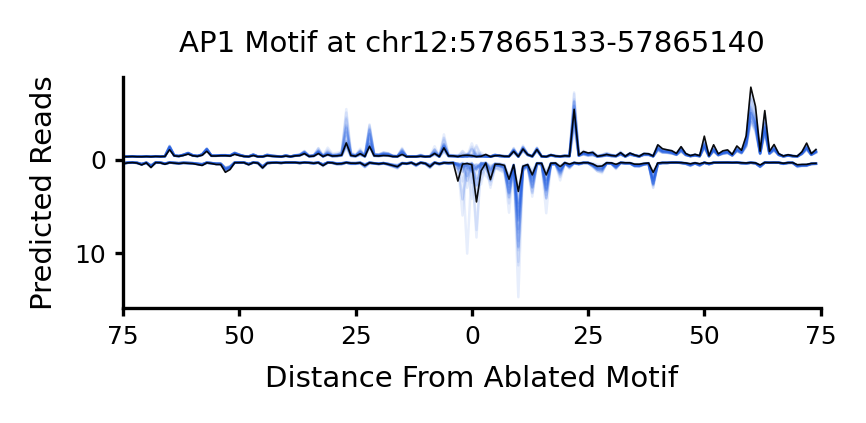



 ===== TA-Inr ===== 


TA-Inr Example 1669
TA-Inr Example 5527
910 912


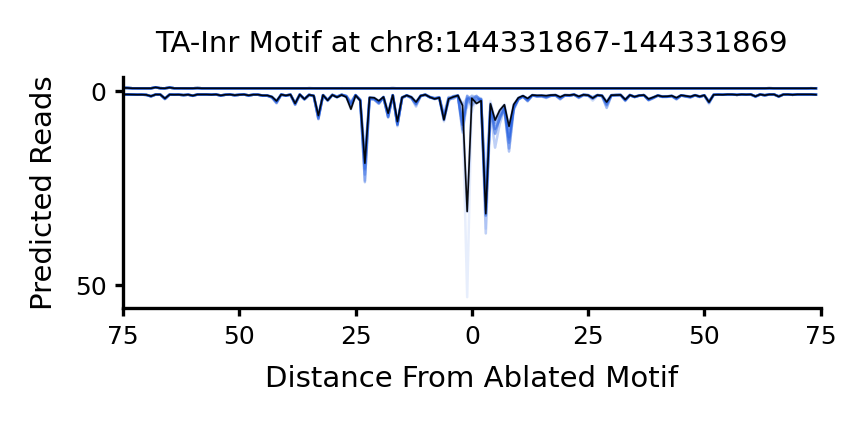

TA-Inr Example 2072
1103 1105


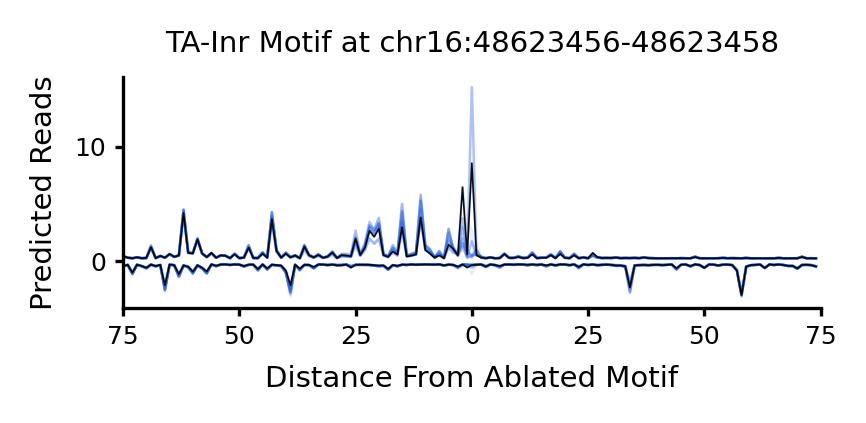

TA-Inr Example 276
TA-Inr Example 1620
1091 1093


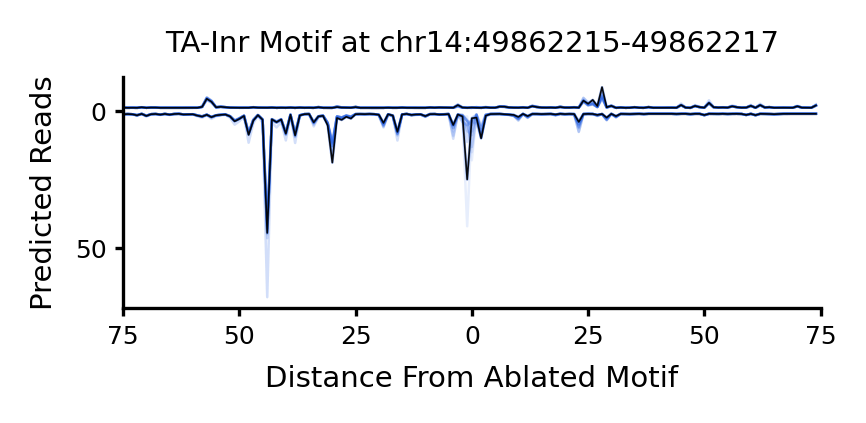

TA-Inr Example 3178
TA-Inr Example 3997
1010 1012


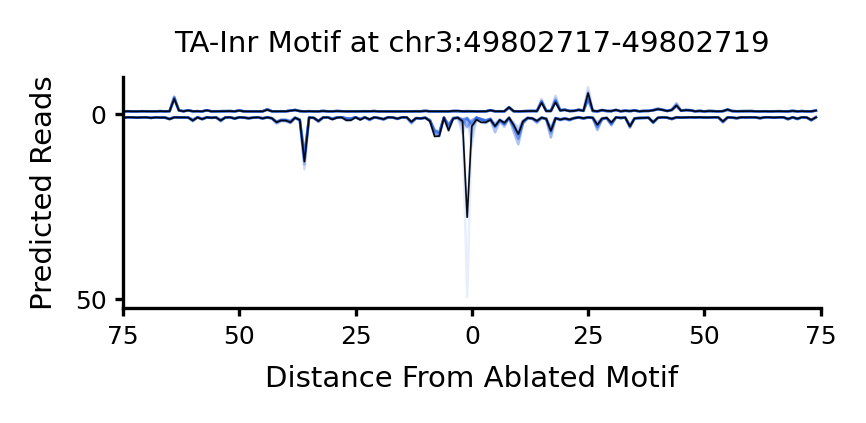

TA-Inr Example 5321
1014 1016


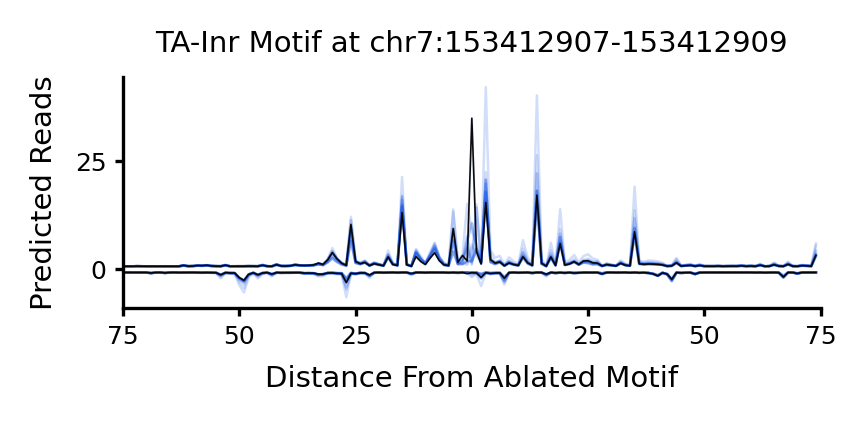

TA-Inr Example 2740
1034 1036


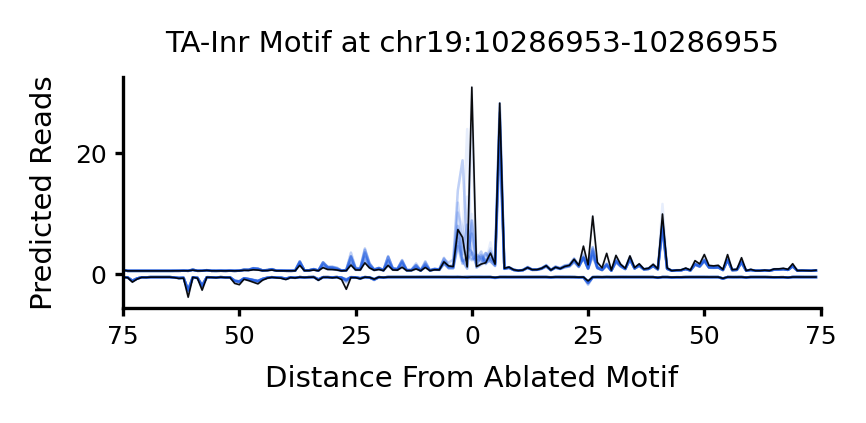

TA-Inr Example 1580
1093 1095


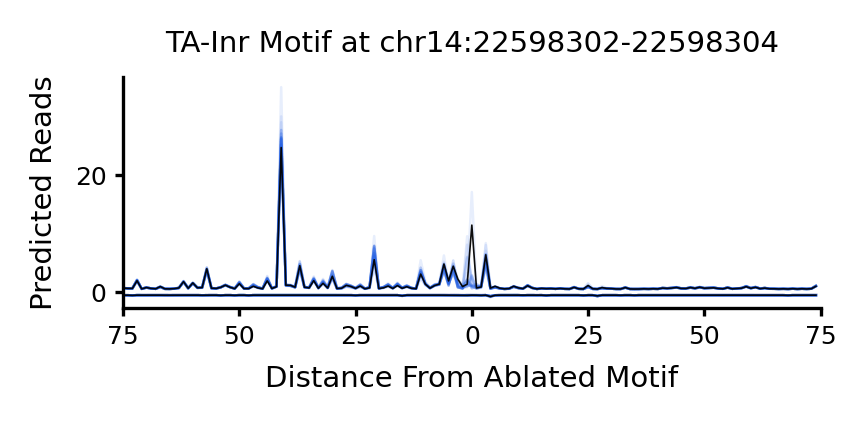



 ===== CTCF ===== 


CTCF Example 200
1055 1070


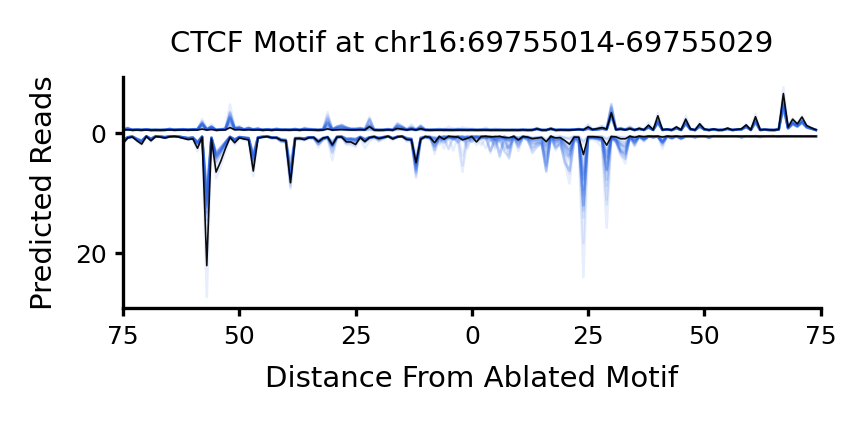

CTCF Example 79
1133 1148


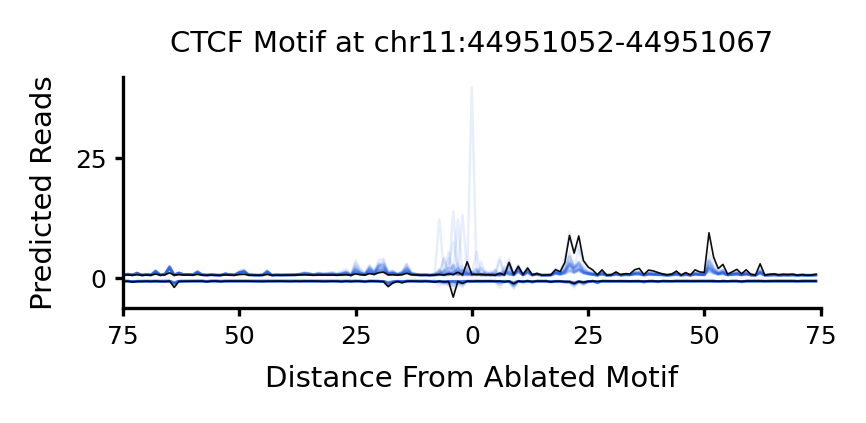

CTCF Example 79
1133 1148


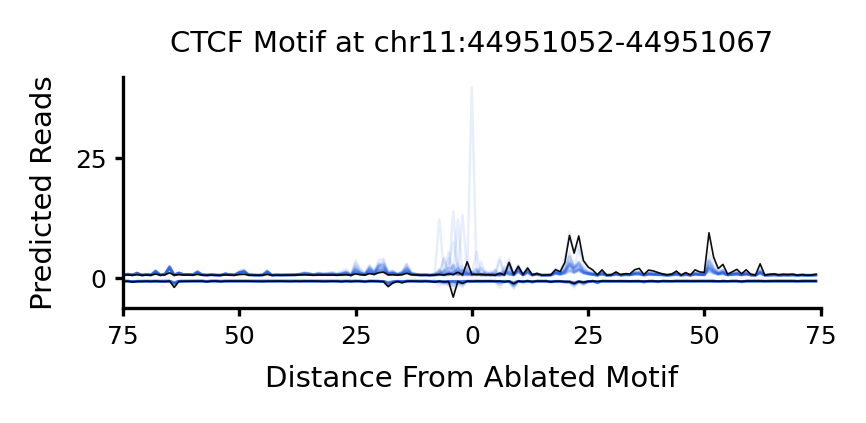

CTCF Example 257
1518 1533


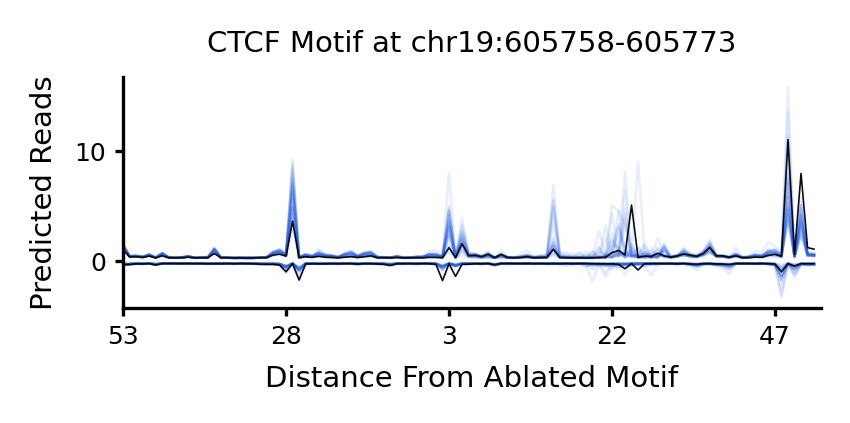

CTCF Example 167
1016 1031


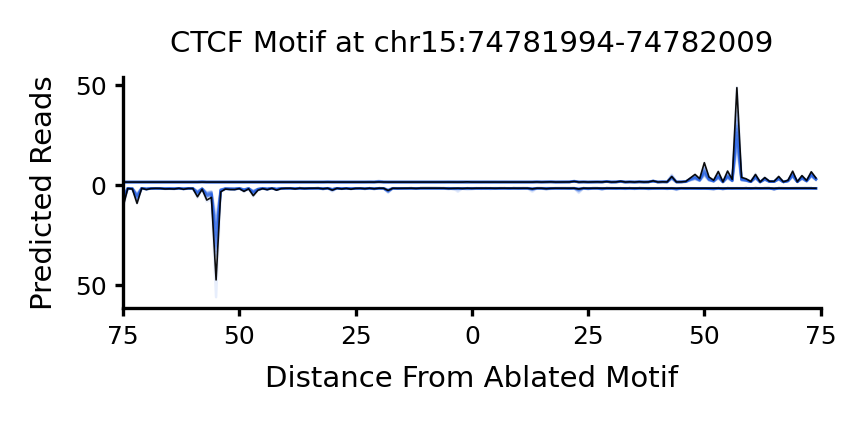

CTCF Example 148
1255 1270


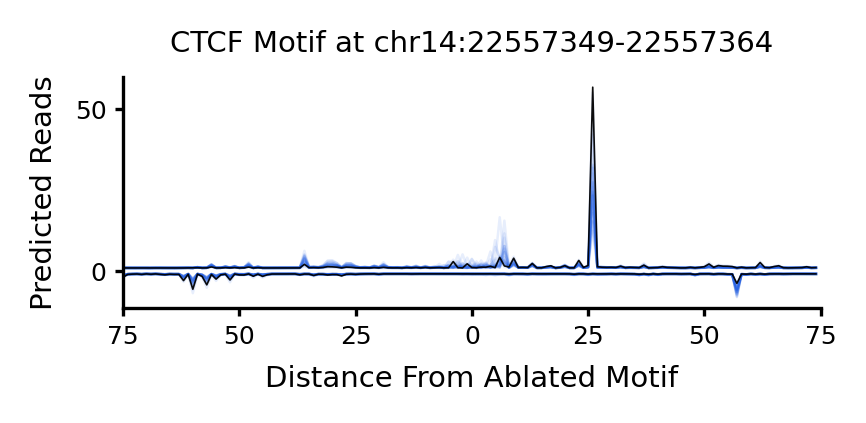

CTCF Example 309
1542 1557


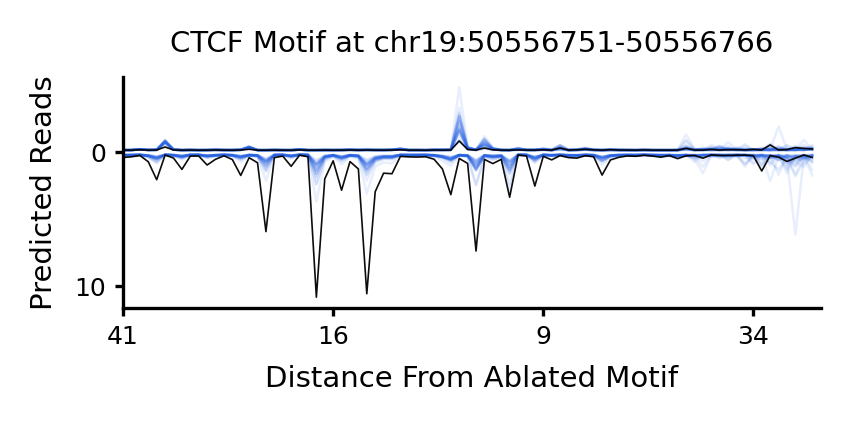

CTCF Example 495
1390 1405


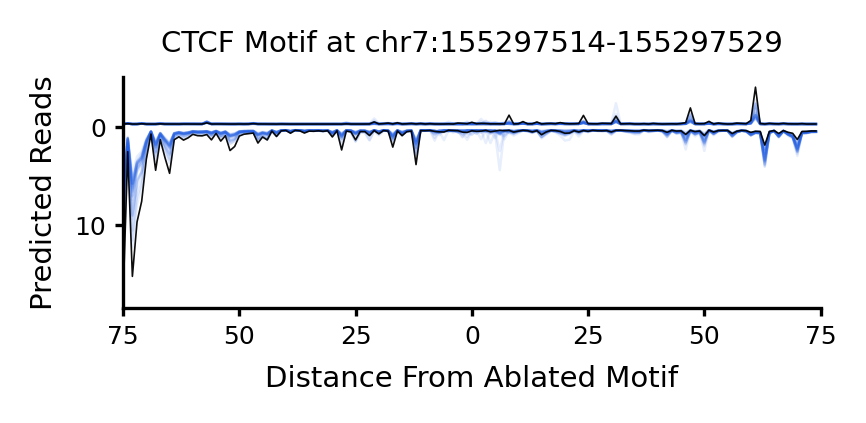

CTCF Example 271
1030 1045


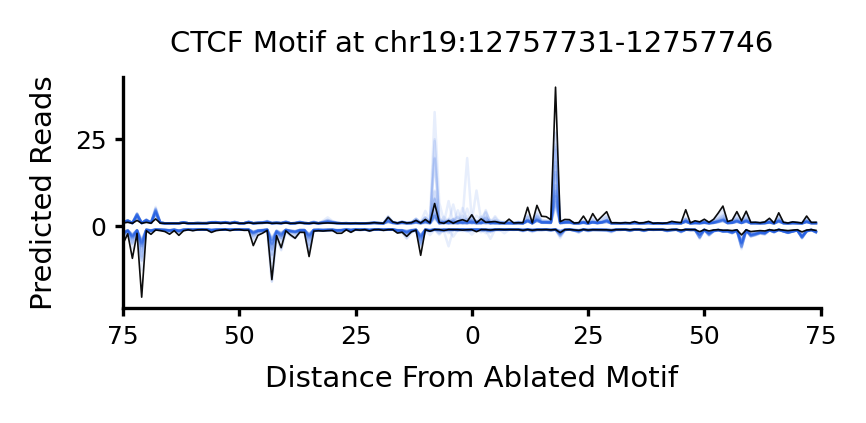

CTCF Example 213
1116 1131


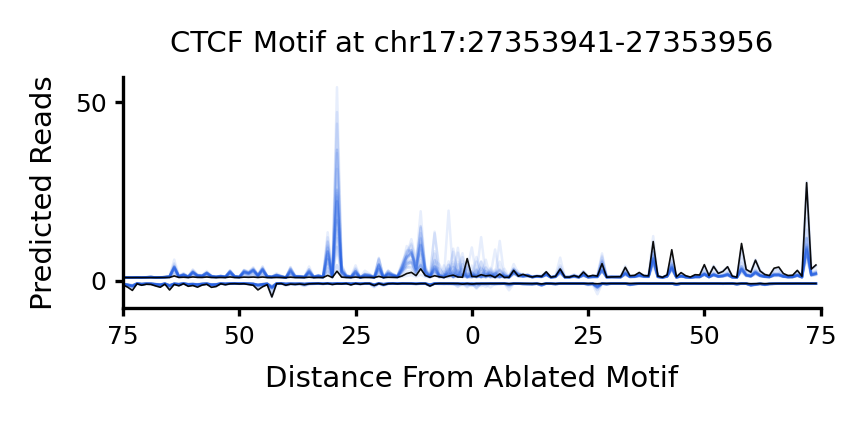



 ===== ZBTB33 ===== 


ZBTB33 Example 76
1106 1116


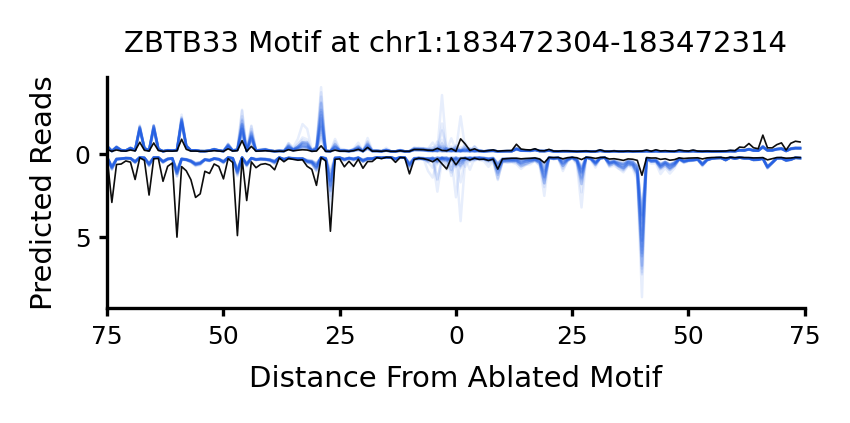

ZBTB33 Example 559
1046 1056


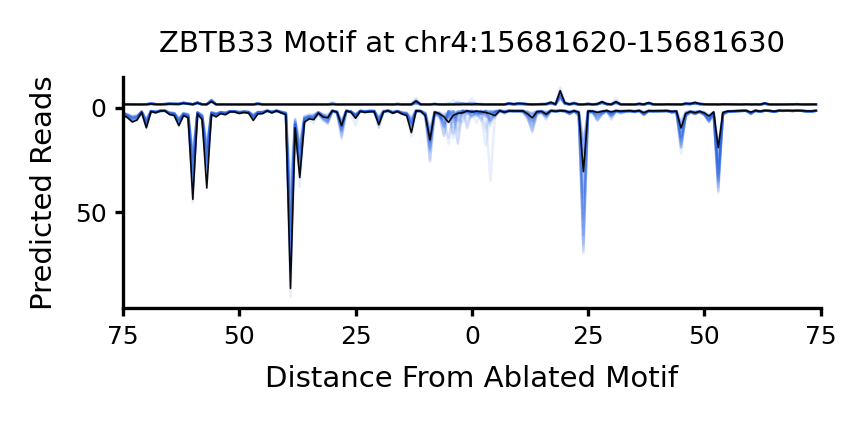

ZBTB33 Example 583
1003 1013


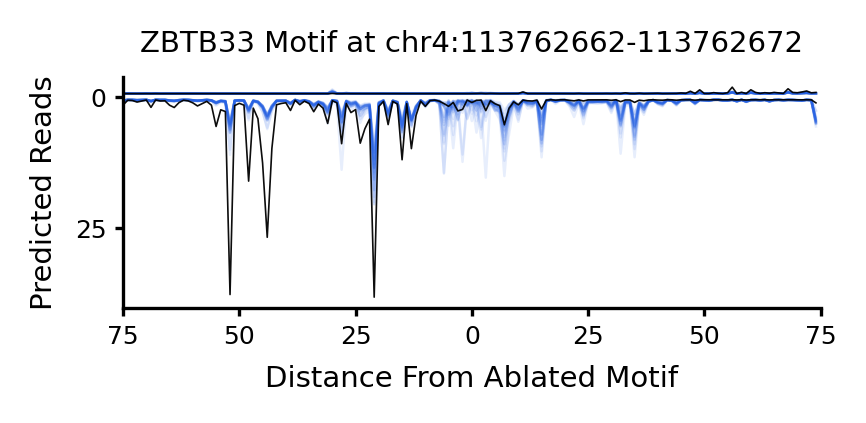

ZBTB33 Example 236
1160 1170


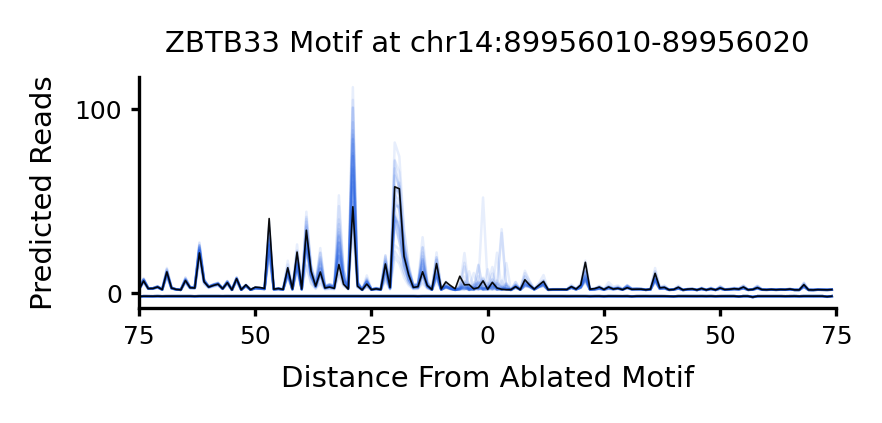

ZBTB33 Example 506
1045 1055


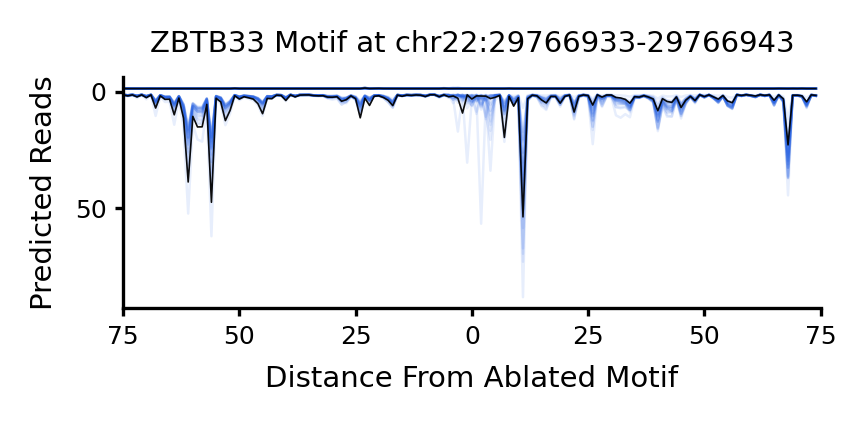

ZBTB33 Example 367
761 771


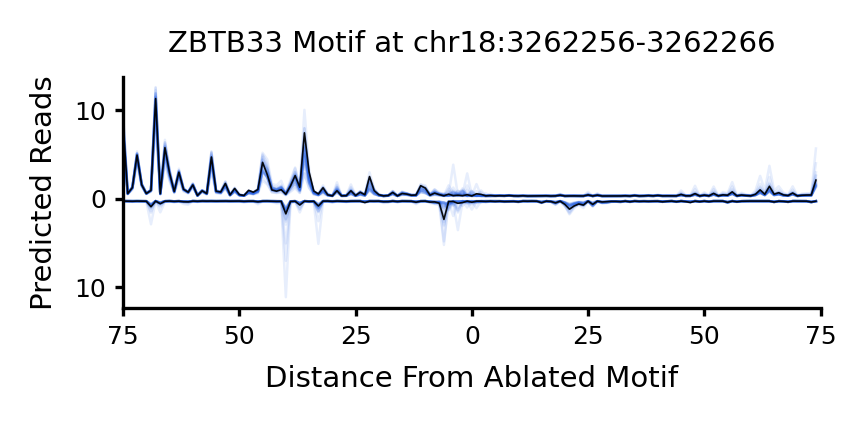

ZBTB33 Example 658
917 927


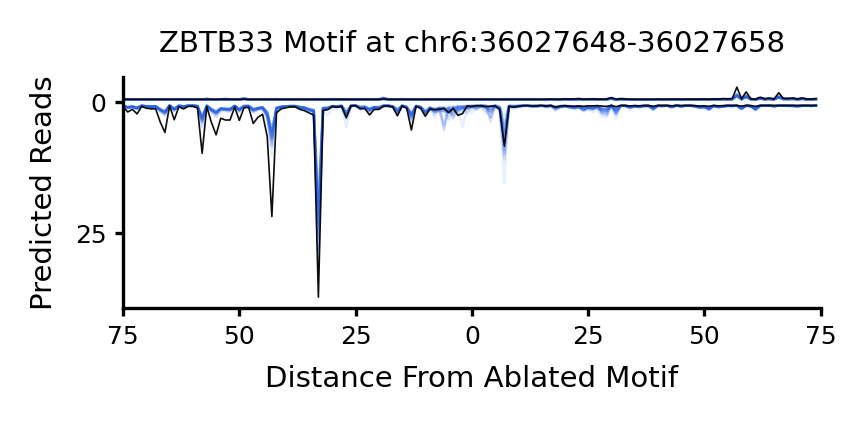

ZBTB33 Example 428
1055 1065


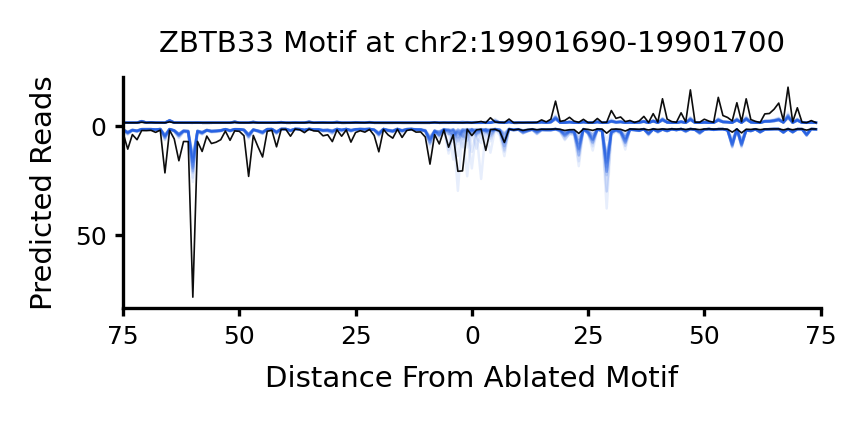

ZBTB33 Example 174
1238 1248


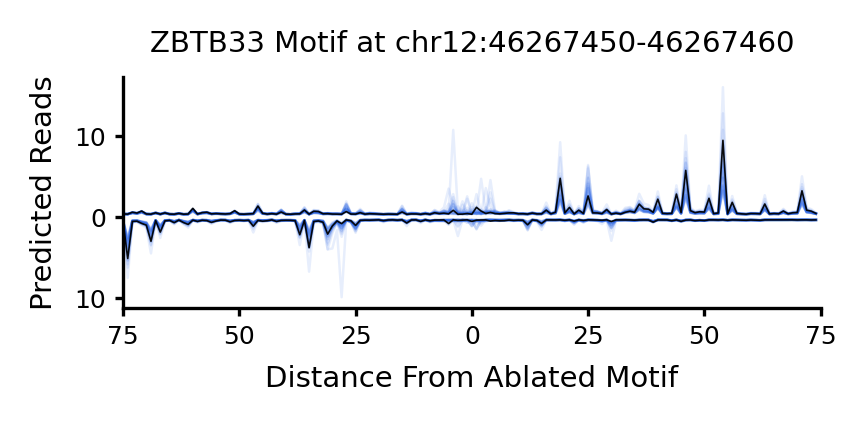

ZBTB33 Example 795
1521 1531


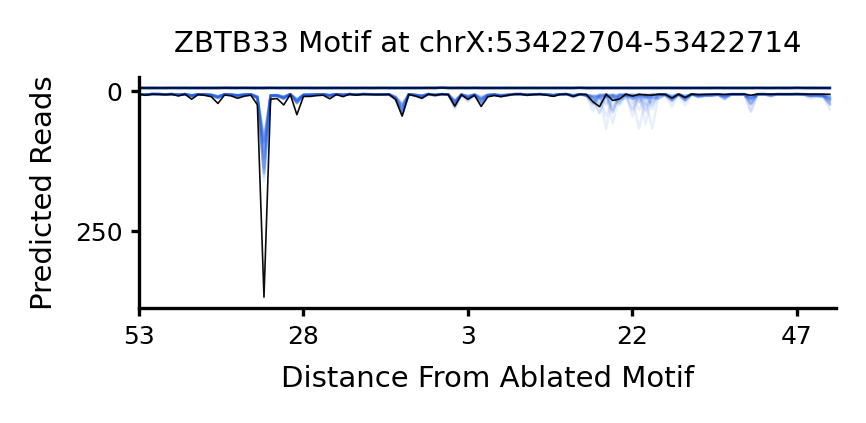



 ===== TCT ===== 


TCT Example 94
1464 1472


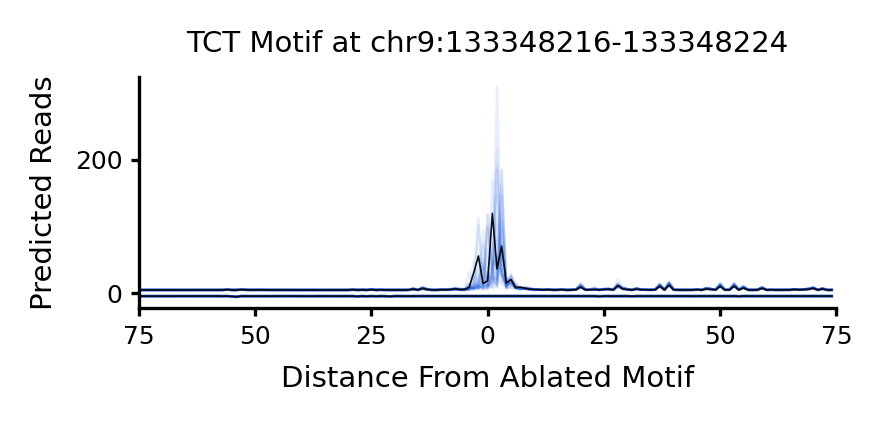

TCT Example 71
1105 1113


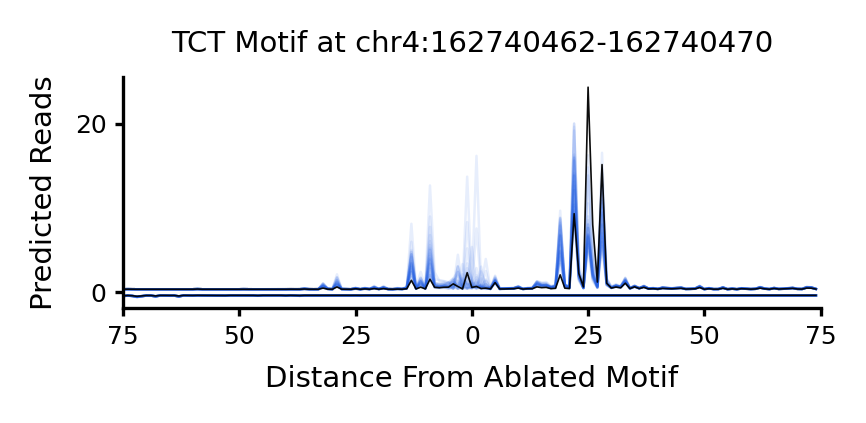

TCT Example 12
997 1005


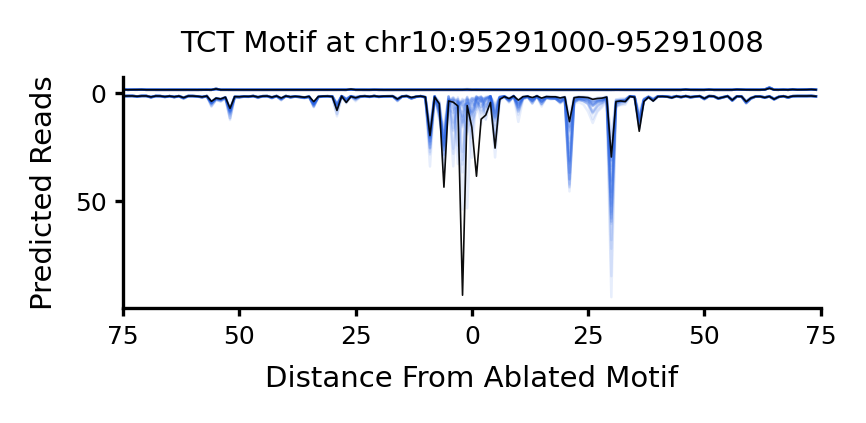

TCT Example 45
1273 1281


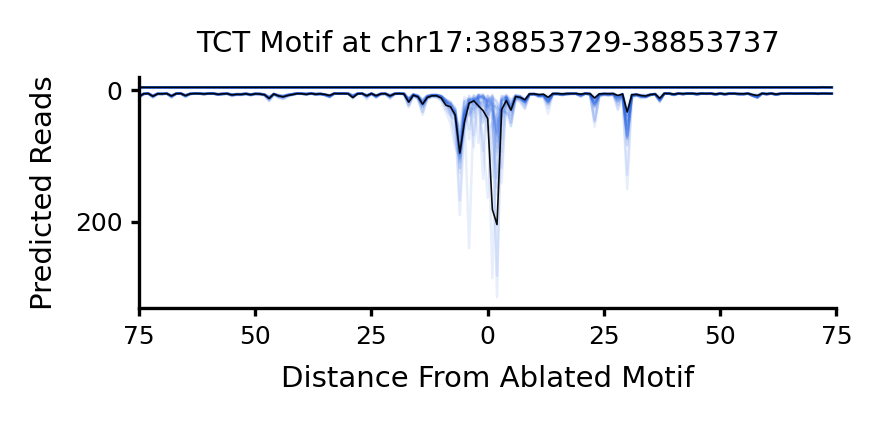

TCT Example 16
987 995


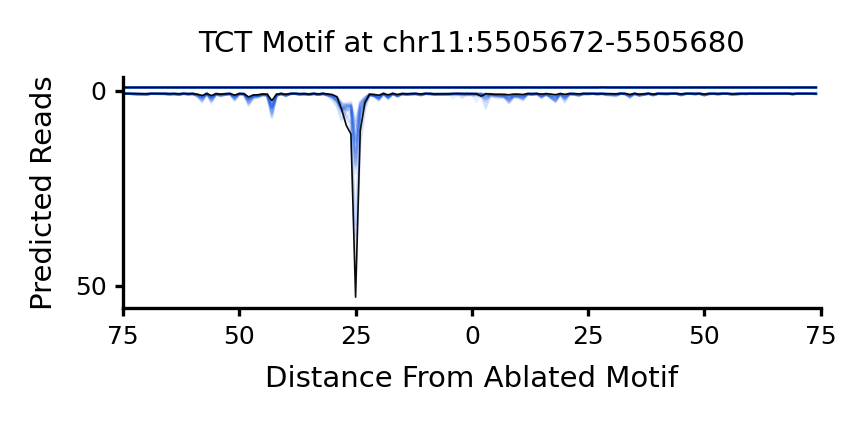

TCT Example 41
1110 1118


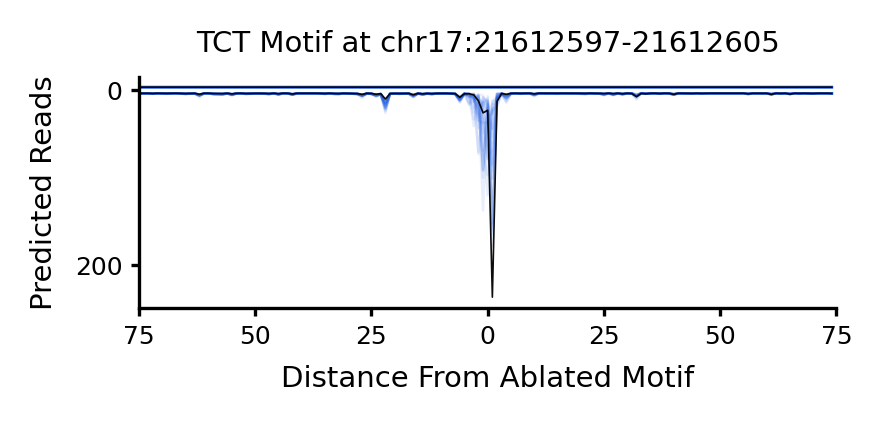

TCT Example 34
636 644


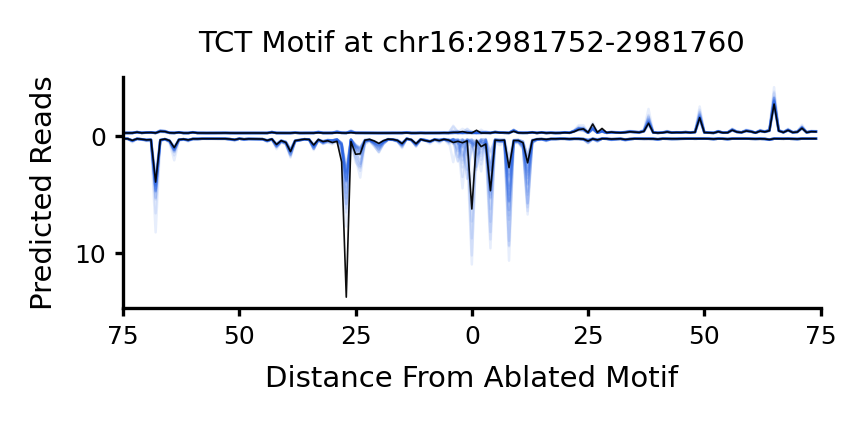

TCT Example 15
958 966


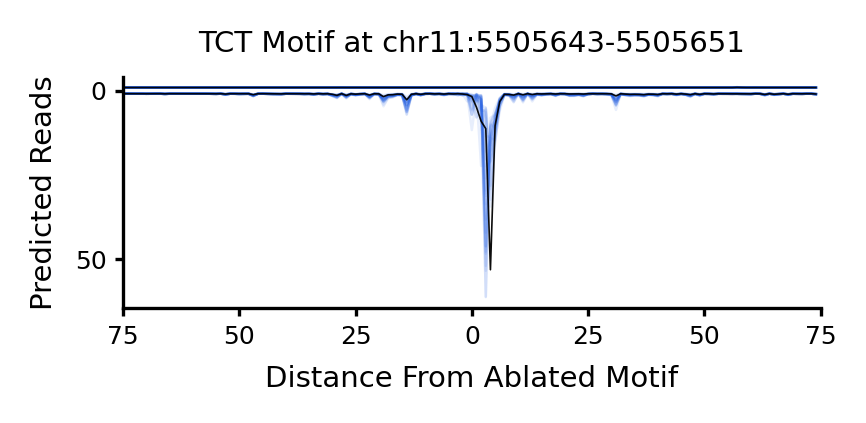

TCT Example 79
1083 1091


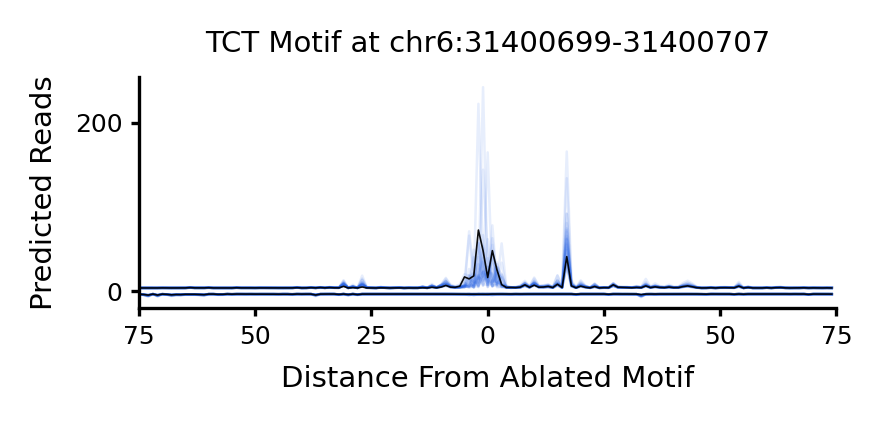

TCT Example 78
1147 1155


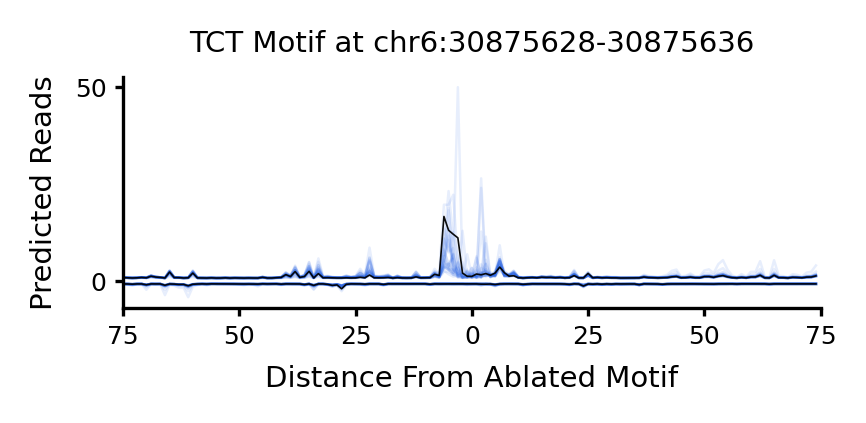



 ===== TATATA ===== 


TATATA Example 3283
TATATA Example 2008
1182 1189


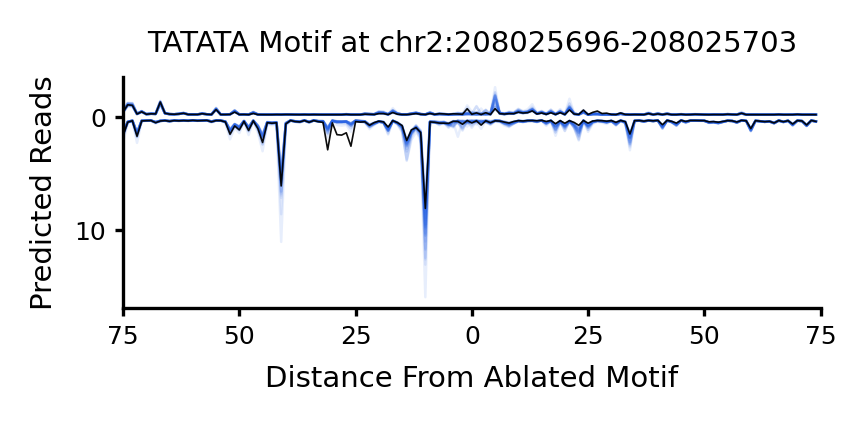

TATATA Example 3714
1062 1069


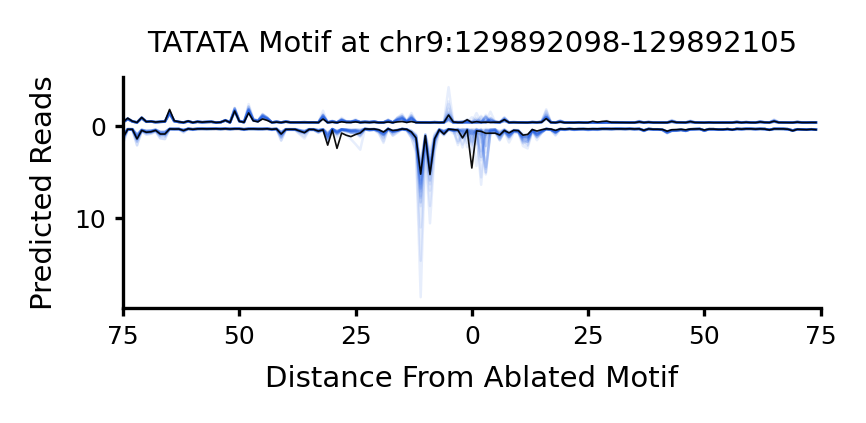

TATATA Example 1271
TATATA Example 661
TATATA Example 3772
1222 1229


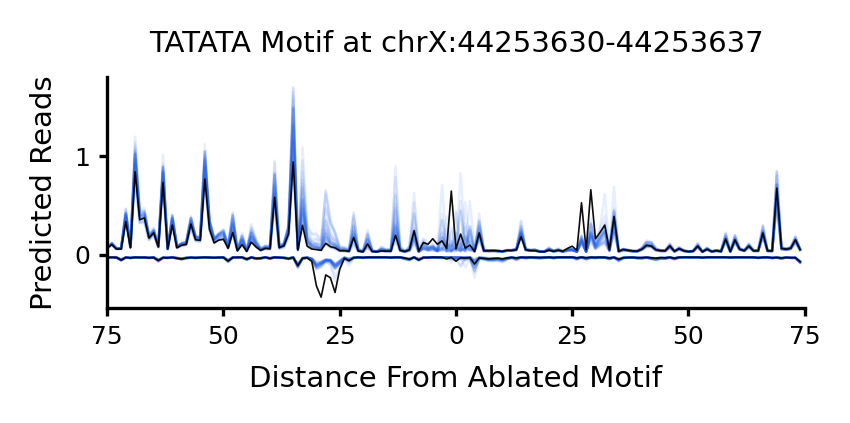

TATATA Example 36
1015 1022


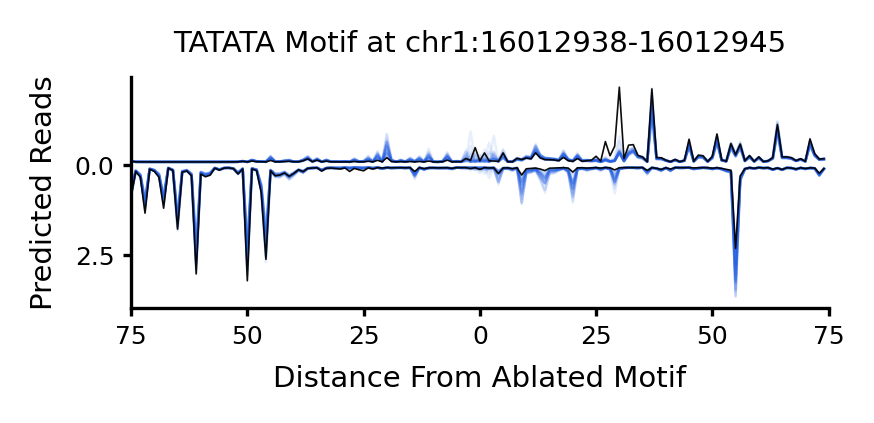

TATATA Example 1638
TATATA Example 3183
TATATA Example 1293


In [47]:
# first, look at some random example peaks and see original vs. ablated predictions

for motif_i, motif_name in enumerate(motif_names):
    print("\n\n ===== " + motif_name + " ===== \n\n")
    
    motif_hits_this_motif = motif_hits[motif_i]
    peaks_with_motif = motif_hits_this_motif["peak_index"]
    og_scaled_pred_profs_with_hit = og_scaled_pred_profs[peaks_with_motif]
    
    random_examples = rng.choice(len(motif_hits_this_motif), size=10)
    
    for ex_i in random_examples:
        print(motif_name + " Example " + str(ex_i))
        
        motif_chrom = motif_hits_this_motif["chrom"][ex_i]
        motif_start = motif_hits_this_motif["start"][ex_i]
        motif_end = motif_hits_this_motif["end"][ex_i]
        motif_start_genomic = motif_hits_this_motif["genomic_start"][ex_i]
        motif_end_genomic = motif_hits_this_motif["genomic_end"][ex_i]
        
        motif_coord_str = motif_chrom + ':' + str(motif_start_genomic) + "-" + str(motif_end_genomic)
        
        save_path = examples_dir + "6B_" + motif_name.replace("/", "-") + "_" + str(ex_i) + ".png"
        
        if np.sum(og_scaled_pred_profs_with_hit[ex_i]) < 100:
            continue
            
        print(motif_start, motif_end)
        plot_pred_profs_vs_og(ablated_scaled_pred_profs[motif_i][ex_i],
                              og_scaled_pred_profs_with_hit[ex_i],
                              motif_start, motif_end,
                              title = motif_name + ' Motif at ' + motif_coord_str,
                              plot_width = 75,
                              include_legend = False)#,
                              #save_path = save_path)


In [120]:
# plot a specific set of examples for Fig6B

examples_to_plot = [("CA-Inr", 20171), ("CTCF", 213), ("YY1", 790)]

data_to_plot = []
for ex_motif_name, ex_i in examples_to_plot:
    motif_i = motif_names.index(ex_motif_name)
    
    motif_hits_this_motif = motif_hits[motif_i]
    peak_index = motif_hits_this_motif["peak_index"][ex_i]
    
    motif_chrom = motif_hits_this_motif["chrom"][ex_i]
    motif_start = motif_hits_this_motif["start"][ex_i]
    motif_end = motif_hits_this_motif["end"][ex_i]
    motif_start_genomic = motif_hits_this_motif["genomic_start"][ex_i]
    motif_end_genomic = motif_hits_this_motif["genomic_end"][ex_i]
        
    og_scaled_pred_prof_ex = og_scaled_pred_profs[peak_index]
      
    motif_coord_str = motif_chrom + ':' + str(motif_start_genomic) + "-" + str(motif_end_genomic)
    title = ex_motif_name + ' Motif at ' + motif_coord_str
    
    ablated_scaled_pred_prof_ex = ablated_scaled_pred_profs[motif_i][ex_i]
    
    data = (ablated_scaled_pred_prof_ex, og_scaled_pred_prof_ex,
            motif_start, motif_end, title)
    
    data_to_plot.append(data)

In [139]:
def plot_prof_on_axis(ax, prof_to_plot, buff=0, alpha = 1,
                      c = ["#1B5AE3"], linewidth=1):
    
    assert len(prof_to_plot.shape) == 2, prof_to_plot.shape
    assert prof_to_plot.shape[0] == 2, prof_to_plot.shape

    if type(c) == list:
        if len(c) >= 2:
            pos_color, neg_color = c[:2]
        else:
            pos_color, neg_color = c[0], c[0]
    else:
        pos_color, neg_color = c, c
    
    ax.plot(np.arange(prof_to_plot.shape[-1]), prof_to_plot[0] + buff,
            c=pos_color, linewidth=linewidth, alpha=alpha)
        
    ax.plot(np.arange(prof_to_plot.shape[-1]), -1 * prof_to_plot[1] - buff,
            c=neg_color, linewidth=linewidth, alpha=alpha)
    

def plot_ablated_pred_profs_vs_og_subplot(ax, pred_profs_scaled,
                                          og_pred_prof_scaled,
                                          median_only = False,
                                          xticks=True, ylabel=True):
    
    prof_len = og_pred_prof_scaled.shape[-1]
    zero_buff = calc_zero_buffer(og_pred_prof_scaled,
                                 pred_profs_scaled)
    
    if median_only:
        plot_prof_on_axis(ax, np.median(pred_profs_scaled, axis=0),
                          buff = zero_buff, alpha=1)
    else:
        for pred_prof in pred_profs_scaled:
            plot_prof_on_axis(ax, pred_prof,
                              alpha=0.1, buff = zero_buff, linewidth=0.6)
    
    plot_prof_on_axis(ax, og_pred_prof_scaled,
                      buff = zero_buff, c="k", linewidth=0.4, alpha=0.95)
    
    ax.set_xlim(0, prof_len)
    
    curr_yticks = ax.get_yticks()[1:-1]
    any_floats = not all([y.is_integer() for y in curr_yticks])
    if not any_floats:
        curr_yticks = np.array(curr_yticks, dtype=int)
    ax.set_yticks(curr_yticks, np.abs(curr_yticks))
    
    ax.tick_params("both", labelsize=6, pad=2, length=2)
    
    if ylabel:
        ax.set_ylabel("Predicted PRO-cap Reads", fontsize=7.5)
    
    ax.spines[["top", "right"]].set_visible(False)

    if xticks:
        ax.set_xlabel("Distance From Ablated Motif", fontsize=7)
        
        # make xticks be zero at center
        if prof_len < 200:
            xticks = np.arange(0, prof_len + 1, 25)
        else:
            xticks = np.arange(0, prof_len + 1, 50)
        ax.set_xticks(xticks, np.abs(xticks - prof_len // 2))
    
    
    
def plot_pred_profs_vs_og_multi(data_to_plot, plot_width=100, median_only=False,
                          include_legend = True, save_path = None):
    num_examples = len(data_to_plot)
    
    fig, axes = plt.subplots(num_examples, figsize=(3.7,2.4), dpi=300, sharex=True)
    
    plt.subplots_adjust(hspace=0.5)
    
    for plot_i, data in enumerate(data_to_plot):
        pred_profs_scaled, og_pred_prof_scaled, motif_start, motif_end, title = data

        if median_only and title is None:
            title = "Median Predictions After Motif Ablation"
        elif title is None:
            title = "Predictions After Motif Ablation"
        
        motif_mid = (motif_start + motif_end) // 2 - (in_window - out_window) // 2
        xlim_min = max(0,motif_mid - plot_width)
        xlim_max = min(out_window, motif_mid + plot_width)
        
        if include_legend and plot_i == 0:
            axes[plot_i].set_title(title, fontsize=7, y=1.25)
        else:
            axes[plot_i].set_title(title, fontsize=7, y=0.9)

        plot_ablated_pred_profs_vs_og_subplot(axes[plot_i],
                                              pred_profs_scaled[..., xlim_min:xlim_max],
                                              og_pred_prof_scaled[..., xlim_min:xlim_max],
                                              median_only = False,
                                              xticks = plot_i == num_examples - 1,
                                              ylabel = plot_i == 1)  # sorry hardcoding for 3 plots
        
        if include_legend:
            custom_lines = [Line2D([0], [0], color="k", lw=0.7),
                            Line2D([0], [0], color="#1B5AE3", lw=1)]

            plt.legend(custom_lines,
                      ["Original ProCapNet Prediction", "Prediction After Motif Ablation"],
                      fontsize=5.5, loc="upper center", ncol=2, frameon=False,
                      bbox_to_anchor=(0.5,4.4))
        
    fig.align_ylabels()
        
    if save_path is not None:
        plt.savefig(save_path, bbox_inches = 'tight', pad_inches = 0, dpi = 300)
    
    
    plt.show()

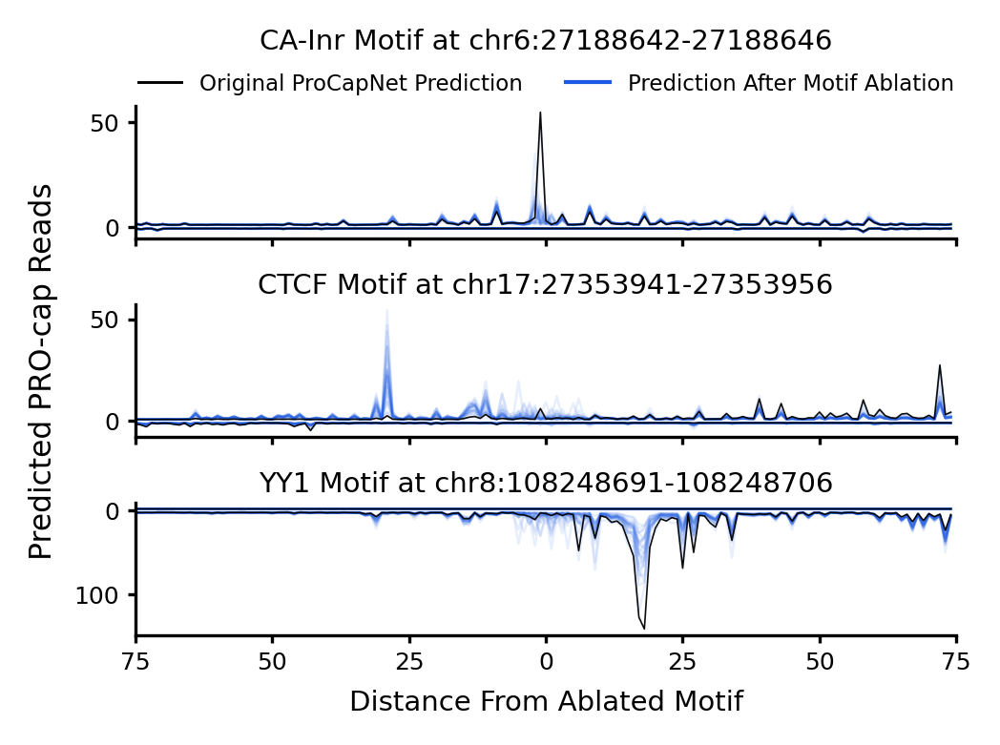

In [141]:
plot_pred_profs_vs_og_multi(data_to_plot,
                      plot_width=75,
                      include_legend = True,
                      save_path = figures_dir + "6B_" + "_".join([ex[0] for ex in examples_to_plot]) + ".png")

## Counts Contributions of Motifs

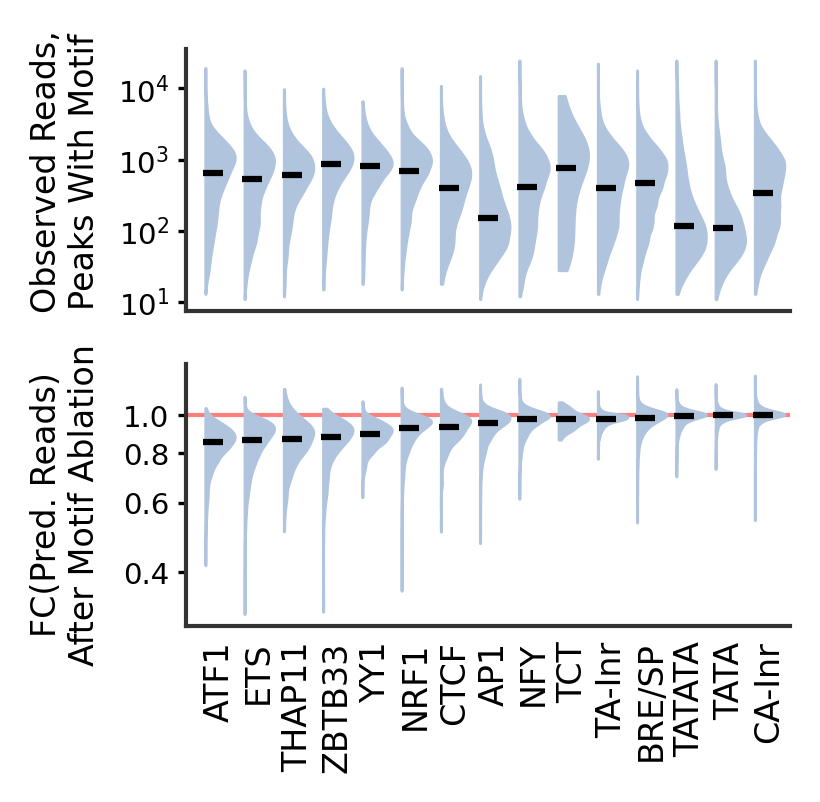

In [150]:
def make_violinplot_halved(violinplot, color="lightsteelblue", left=False):
    for b in violinplot['bodies']:
        # get the center
        m = np.mean(b.get_paths()[0].vertices[:, 0])
        
        if left:
            # modify the paths to not go further right than the center
            b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], - np.inf, m)
        else:
            # modify the paths to not go further left than the center
            b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], m, np.inf)

        b.set_edgecolor(color)
        b.set_facecolor(color)
        b.set_alpha(1)
        b.set_linewidth(0.7)


def half_violin_plot(ax, vals):
    num_violins = len(vals)
    
    median_vals = [np.median(val_list) for val_list in vals]
    
    v1 = ax.violinplot(vals, points=500,
                       positions=range(num_violins),
                       showmeans=False, showextrema=False, showmedians=False,
                       widths=1.5)
    
    make_violinplot_halved(v1)
    
    
    ax.scatter(np.arange(num_violins) + 0.2, median_vals,
                marker="_", c="k", s=25, zorder=1)
    
    ax.tick_params("x", length=0)
    ax.set_xlabel("")
    ax.set_xlim(-0.5, num_violins - 0.)
    
    ax.spines[["top", "right"]].set_visible(False)
    ax.spines[["left", "bottom"]].set_linewidth(1)
    ax.spines[["left", "bottom"]].set_color("#333333")
    
    


def plot_true_and_ablated_logcounts_violins(true_counts, motif_hits,
                                             og_pred_counts,
                                             ablated_pred_logcounts,
                                             log_axis = True, save_path = None):
    obs_y_vals = []
    ablate_y_vals = []
    medians = []
    
    for motif_i in range(len(motif_names)):
        motif_hits_this_motif = motif_hits[motif_i]
        peaks_with_motif = motif_hits_this_motif["peak_index"]
        obs_y_vals.append(np.log10(true_counts[peaks_with_motif].squeeze() + 1))

        og_pred_counts_per_hit = og_pred_counts[peaks_with_motif]

        fcs = np.exp(ablated_pred_logcounts[motif_i].squeeze()) / og_pred_counts_per_hit
        
        # take the median across all ablations of the same peak
        median_fcs = np.median(fcs, axis=1)
        ablate_y_vals.append(np.log10(median_fcs))
        medians.append(np.log10(np.median(median_fcs))) # this is the median across all peaks
        
    plot_order = np.argsort(medians)
    obs_y_vals = [obs_y_vals[i] for i in plot_order]
    ablate_y_vals = [ablate_y_vals[i] for i in plot_order]

    
    fig, axes = plt.subplots(2, figsize=(2.6, 2.5), dpi=300, sharex=True)
        
    half_violin_plot(axes[0], obs_y_vals)
    
    axes[0].set_ylabel("Observed Reads,\nPeaks With Motif", fontsize=8, y=0.535)
    
    yticks = [np.log10(10**y) for y in range(1,5)]
    yticklabels = [r'$10^{' + str(y) + "}$" for y in range(1,5)]
    axes[0].set_yticks(yticks, yticklabels)
    axes[0].tick_params("y", labelsize=7, length=2, pad=2)
    axes[0].set_xticks([])

    
    half_violin_plot(axes[1], ablate_y_vals)
    
    axes[1].set_ylabel("FC(Pred. Reads)\nAfter Motif Ablation", fontsize=8, y=0.465)
    
    axes[1].set_xticks(np.arange(len(plot_order)) + 0.35,
               np.array(motif_names)[plot_order],
               fontsize=8, rotation=90)
    
    log_yticks = np.array([0.4, 0.6, 0.8, 1])
    axes[1].set_yticks(np.log10(log_yticks), log_yticks)
        
    axes[1].set_xlim(-0.5, len(plot_order) - 0.1)
        
    axes[1].tick_params("y", labelsize=7, length=2, pad=2)
    
    axes[1].hlines(0, -0.5, len(plot_order), color='r',alpha=0.5, linewidth=1, zorder=-1)
    
    fig.align_ylabels()
    
    if save_path is not None:
        plt.savefig(save_path, bbox_inches = 'tight', pad_inches = 0, dpi = 300)
    
    plt.show()


plot_true_and_ablated_logcounts_violins(true_counts, motif_hits,
                                        og_pred_counts, ablated_pred_logcounts, log_axis=False,
                                        save_path = figures_dir + "6_fc_violins.png")

## Profile Contributions of Motifs

In [48]:
def convert_motif_midpoint_to_array_slices(motif_mid, flipped_orientation = False,
                                           out_window=out_window):
    if flipped_orientation:
        motif_mid = out_window - motif_mid
        
    o = motif_mid - out_window // 2
    
    array_1_slice_start = max(0, o)
    array_1_slice_end = min(out_window, out_window + o) ## 

    array_2_slice_start = max(0, - o)
    array_2_slice_end = min(out_window, out_window - o)
    
    assert array_2_slice_end - array_2_slice_start == array_1_slice_end - array_1_slice_start
    return array_1_slice_start, array_1_slice_end, array_2_slice_start, array_2_slice_end


def calc_median_pred_profs_no_ablation(og_pred_profs, motif_hits):
    median_pred_profs = dict()
    
    for motif_i in motif_hits.keys():

        motif_hits_this_motif = motif_hits[motif_i]
        og_pred_profs_with_hit = og_pred_profs[motif_hits_this_motif["peak_index"]]

        # we need to center each profile on the motif before taking the median...
        
        og_pred_profs_shifted = np.zeros((len(og_pred_profs_with_hit), 2, out_window))
        
        for locus_i in range(len(motif_hits_this_motif)):
            motif_start = motif_hits_this_motif["start"][locus_i]
            motif_end = motif_hits_this_motif["end"][locus_i]
            motif_orientation = motif_hits_this_motif["strand"][locus_i]
            
            # adjust the motif coordinate to be the center, relative to the profile itself
            # (current coordinates are reltive to the sequence)
            motif_mid = (motif_start + motif_end) // 2 - (in_window - out_window) // 2

            diff_start, diff_end, dest_start, dest_end = convert_motif_midpoint_to_array_slices(motif_mid,
                                                           flipped_orientation = motif_orientation == "-")

            # flip profile if the motif was in the opposite orientation
            # (so that avg. profile can show strand-specific motif effects)
            
            if motif_orientation == "-":
                og_pred_prof = og_pred_profs_with_hit[locus_i][::-1, ::-1]
            else:
                og_pred_prof = og_pred_profs_with_hit[locus_i]

            og_pred_profs_shifted[locus_i, :, dest_start:dest_end] = og_pred_prof[:, diff_start:diff_end]

        median_pred_profs[motif_i] = np.median(og_pred_profs_shifted, axis=0)
        
    return median_pred_profs


median_pred_prof_no_ablation = calc_median_pred_profs_no_ablation(og_pred_profs, motif_hits)

In [73]:
def calc_median_ablated_profs(ablated_pred_profs, motif_hits):
    median_median_pred_profs = dict()
    
    for motif_i in motif_hits.keys():
        motif_hits_this_motif = motif_hits[motif_i]
        
        print(motif_i, "num hits:", len(motif_hits_this_motif))
        
        median_pred_profs = np.zeros((len(motif_hits_this_motif), 2, out_window))
        for locus_i in range(len(motif_hits_this_motif)):
            motif_start = motif_hits_this_motif["start"][locus_i]
            motif_end = motif_hits_this_motif["end"][locus_i]
            motif_orientation = motif_hits_this_motif["strand"][locus_i]

            # adjust the motif coordinate to be the center, relative to the profile itself
            # (current coordinates are reltive to the sequence)
            motif_mid = (motif_start + motif_end) // 2 - (in_window - out_window) // 2

            diff_start, diff_end, dest_start, dest_end = convert_motif_midpoint_to_array_slices(motif_mid,
                                                           flipped_orientation = motif_orientation == "-")

            # flip profile if the motif was in the opposite orientation
            # (so that avg. profile can show strand-specific motif effects)

            if motif_orientation == "-":
                profs = ablated_pred_profs[motif_i][locus_i][:, ::-1, ::-1]
            else:
                profs = ablated_pred_profs[motif_i][locus_i]
                
            profs = np.exp(profs) ####### -- because these are log_pred_profiles

            # take the median across all the repeat ablations of same motif
            median_pred_prof = np.median(profs, axis=0)

            median_pred_profs[locus_i, :, dest_start:dest_end] = median_pred_prof[:, diff_start:diff_end]

        # take the median across all motif instances
        median_median_pred_profs[motif_i] = np.median(median_pred_profs, axis=0)
        
    return median_median_pred_profs


median_ablated_pred_profs = calc_median_ablated_profs(ablated_pred_profs, motif_hits)

0 num hits: 50225
1 num hits: 25464
2 num hits: 14396
3 num hits: 12788
4 num hits: 10623
5 num hits: 2651
6 num hits: 3152
7 num hits: 1590
8 num hits: 879
9 num hits: 5435
10 num hits: 6013
11 num hits: 550
12 num hits: 820
13 num hits: 99
14 num hits: 3851


In [76]:
import matplotlib.patches as patches
from matplotlib.lines import Line2D

def plot_og_and_ablated_pred_profs(median_ablated_pred_profs, median_og_pred_profs,
                                   motif_names = motif_names,
                                        title = "Motif Ablation Effect on TSS Positioning",
                                        save_path = None):
    num_motifs = len(motif_names)
    
    motif_names_order = ['CA-Inr', 'TA-Inr', 'TCT',
                         'TATA', 'TATATA', 'YY1',
                         'NFY', 'BRE/SP', 'ATF1',
                         'CTCF', 'NRF1', 'ZBTB33',
                         'ETS', 'AP1', 'THAP11']
    
    motif_order = [motif_names.index(motif_names_order[i]) for i in range(num_motifs)]
    axes_order = np.arange(len(motif_order))
    
    zoom_width = 150
    
    num_cols = 5
    num_rows = int(np.ceil(num_motifs / num_cols))
    extra_axes = num_rows * num_cols - num_motifs
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(1.8 * num_cols, 1 * num_rows), dpi=300)
    axes = axes.T.flatten()
    
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
    
    for motif_i, ax_i in zip(motif_order, axes_order):
        median_ablated_pred_prof = median_ablated_pred_profs[motif_i]
        median_og_pred_prof = median_og_pred_profs[motif_i]
            
        ax = axes[ax_i]
        motif_name = motif_names[motif_i]
    
        plot_xlim_min = max(0, out_window // 2 - zoom_width)
        plot_xlim_max = min(out_window, out_window // 2 + zoom_width)

        ax.plot(range(plot_xlim_min, plot_xlim_max),
                 median_og_pred_prof[0, plot_xlim_min:plot_xlim_max],
                 c="gray", linewidth=0.7, alpha=0.85)
        ax.plot(range(plot_xlim_min, plot_xlim_max),
                 -1 * median_og_pred_prof[1, plot_xlim_min:plot_xlim_max],
                 c="gray", linewidth=0.7, alpha=0.4)
        
        
        ax.hlines(0, plot_xlim_min, plot_xlim_max, color="k", alpha=0.5, linestyle="--", linewidth=0.5)
        ax.plot(range(plot_xlim_min, plot_xlim_max),
                 median_ablated_pred_prof[0, plot_xlim_min:plot_xlim_max],
                 c="#4F40D4", label="+ Strand", linewidth=0.8)
        ax.plot(range(plot_xlim_min, plot_xlim_max),
                 -1 * median_ablated_pred_prof[1, plot_xlim_min:plot_xlim_max],
                 c="#505AEA", label="- Strand", linewidth=0.8, alpha=0.7)

        for side in ["top", "right", "left"]:
            ax.spines[side].set_visible(False)
            
        ylim_max = np.max(np.abs(ax.get_ylim()))
        ax.set_ylim((-ylim_max, ylim_max))
        ax.set_yticks([])

        if ax_i == 14:
            ax.set_xticks([out_window // 2, out_window // 2 + zoom_width],
                           ["0", str(zoom_width)])
            
            rect = patches.Rectangle((zoom_width * 2.34, - ylim_max *1.11), zoom_width - 3, 1.5e-5,
                                 clip_on=False, zorder=50, color="white")
            ax.add_patch(rect)
            
            ax.spines['bottom'].set_position(('data', - ylim_max * 1.1))
            ax.spines["bottom"].set_color("#333333")
            
        else:
            ax.set_xticks([])
            ax.spines["bottom"].set_visible(False)

        ax.set_title(motif_name, fontsize=8, y=0.72, loc='left')

        ax.set_xlim(plot_xlim_min, plot_xlim_max)
        ax.tick_params("both", labelsize=7)
        
    ymin, ymax = axes[0].get_ylim()
    zero_point = - ymin / (ymax - ymin)

    axes[0].annotate(r'$fwd. strand$',
        xy=(1.1, 0.1), xycoords='axes fraction',
        xytext=(1, zero_point + 0.2), textcoords='axes fraction',
        horizontalalignment='right', verticalalignment='top',
        fontsize=6, color="#4F40D4")
    axes[0].annotate(r'$rev. strand$',
        xy=(1.1, 0.1), xycoords='axes fraction',
        xytext=(1, zero_point - 0.08), textcoords='axes fraction',
        horizontalalignment='right', verticalalignment='top',
        fontsize=6, color="#505AEA", alpha=0.7) # old color was #5574FF
        
    plt.suptitle(title, fontsize=10, y=0.97)
    
    

    legend_elements = [Line2D([0], [0], color='gray', lw=1.5,
                              label='Original ProCapNet Prediction'),
                       Line2D([0], [0], color='#4F40D4', lw=1.5,
                              label='Prediction After Motif Ablation')]
    plt.legend(handles=legend_elements, fontsize=8, ncol=2, frameon=False,
               loc="center", bbox_to_anchor=(-1.66,-0.25,0,0))
    
    
    if save_path is not None:
        plt.savefig(save_path, bbox_inches = 'tight', pad_inches = 0, dpi = 300)
    
    plt.show()

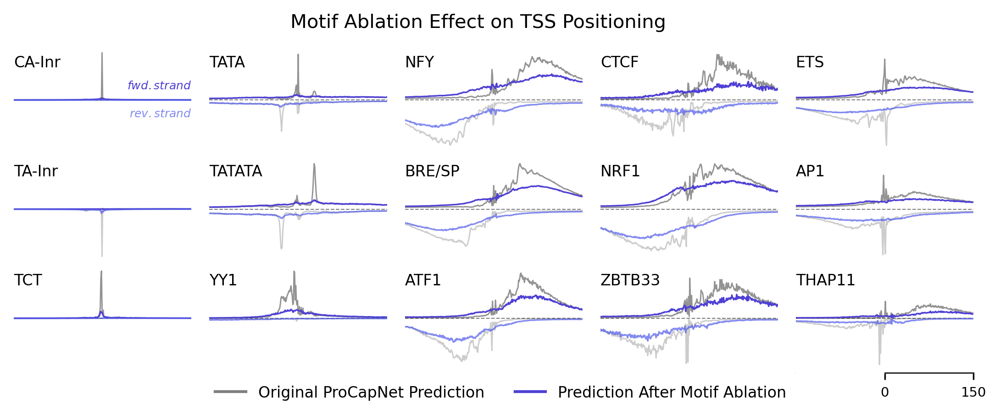

In [78]:
plot_og_and_ablated_pred_profs(median_ablated_pred_profs, median_pred_prof_no_ablation,
                               save_path = figures_dir + "6_med_profs_before_after_ablation.png")

## Supplement

In [118]:
# do large profile motif effects correlate with large counts motif effects?

from scipy.spatial.distance import jensenshannon

def calc_jsds_between_profile_arrays(profs1, profs2):
    jsds = []
    for prof1, prof2 in zip(profs1, profs2):
        # flatten data across strands into 1D array
        prof1 = prof1.flatten()
        prof2 = prof2.flatten()

        jsds.append(jensenshannon(prof1, prof2, base=2))
    return jsds


def calc_jsds_og_and_ablated_pred_profs(og_pred_profs, ablated_pred_profs, motif_hits):
    jsds = dict()
    
    for motif_i in motif_hits.keys():
        print(motif_i)
        motif_hits_this_motif = motif_hits[motif_i]
        peaks_with_motif = motif_hits_this_motif["peak_index"]
        og_pred_profs_with_hit = og_pred_profs[peaks_with_motif]
        
        assert len(og_pred_profs_with_hit) == len(ablated_pred_profs[motif_i])
        
        assert len(og_pred_profs_with_hit.shape) == 3, og_pred_profs_with_hit.shape
        assert og_pred_profs_with_hit.shape[-2:] == (2, out_window), og_pred_profs_with_hit.shape
        
        assert len(ablated_pred_profs[motif_i].shape) == 4, ablated_pred_profs[motif_i].shape
        assert ablated_pred_profs[motif_i].shape[-2:] == (2, out_window), ablated_pred_profs[motif_i].shape
        
        num_scrambles = ablated_pred_profs[motif_i].shape[1]
        
        # calculate the jsd between the pre-ablation and post-ablation profiles,
        # first across all motif instances, then across all ablation repeats (for loop)
        
        jsds_this_motif = []
        for ablate_i in range(num_scrambles):
            _ablated_pred_profs = ablated_pred_profs[motif_i][:, ablate_i]
            
            assert og_pred_profs_with_hit.shape == _ablated_pred_profs.shape
            
            jsds_all_instances_one_scramble = calc_jsds_between_profile_arrays(og_pred_profs_with_hit,
                                                                               _ablated_pred_profs)
            jsds_this_motif.append(jsds_all_instances_one_scramble)

        # take the mean across the num_scrambles axis
        # (leave motif instances axis alone)
        jsds[motif_i] = np.mean(np.array(jsds_this_motif), axis=0)
        
    return jsds

jsds = calc_jsds_og_and_ablated_pred_profs(og_pred_profs, ablated_pred_profs, motif_hits)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


CA-Inr -0.1039
TA-Inr -0.0588
TCT -0.0743
TATA -0.2640
TATATA -0.4799
YY1 -0.2058
NFY -0.2902
BRE/SP 0.0423
ATF1 -0.2158
CTCF -0.2339
NRF1 -0.2404
ZBTB33 -0.3139
ETS -0.1456
AP1 -0.0655
THAP11 -0.2595


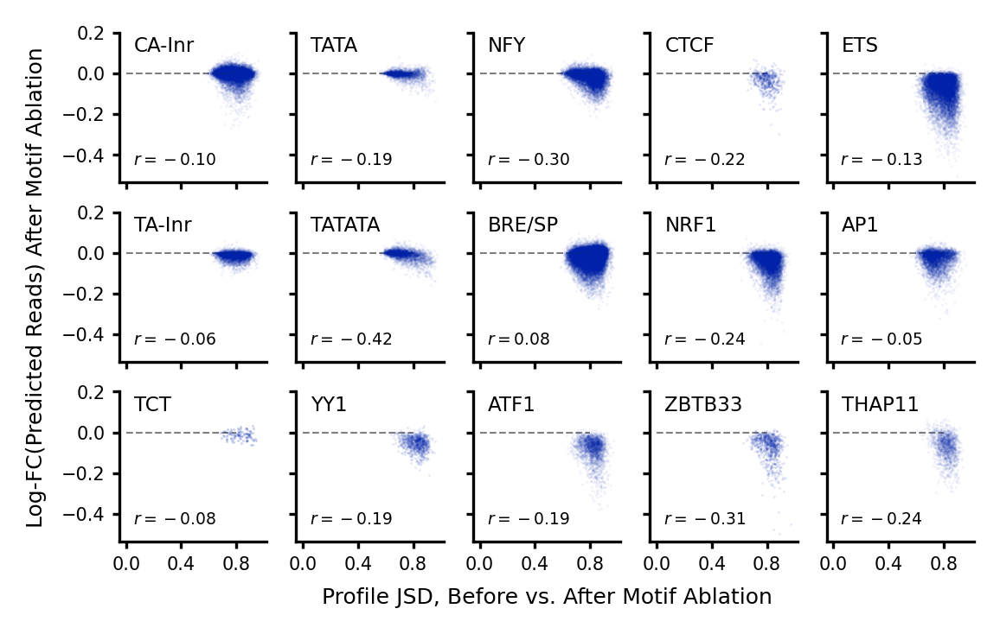

In [119]:
from scipy.stats import spearmanr

def plot_counts_vs_profile_effects(motif_hits,
                                   og_pred_counts, ablated_pred_logcounts,
                                   jsds, save_path = None):

    num_motifs = len(motif_names)
    
    motif_names_order = ['CA-Inr', 'TA-Inr', 'TCT',
                         'TATA', 'TATATA', 'YY1',
                         'NFY', 'BRE/SP', 'ATF1',
                         'CTCF', 'NRF1', 'ZBTB33',
                         'ETS', 'AP1', 'THAP11']
    
    motif_order = [motif_names.index(motif_names_order[i]) for i in range(num_motifs)]
    axes_order = np.arange(len(motif_order))
    
    num_cols = 5
    num_rows = 3
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(0.85 * num_cols, 0.85 * num_rows), dpi=300,
                             sharey=True, sharex=True)
    axes = axes.T.flatten()
    for motif_i, ax_i in zip(motif_order, axes_order):
        ax = axes[ax_i]
        peaks_with_motif = motif_hits[motif_i]["peak_index"]
        og_pred_counts_per_hit = og_pred_counts[peaks_with_motif]

        fcs = np.exp(ablated_pred_logcounts[motif_i].squeeze()) / og_pred_counts_per_hit
        
        # take the median across all ablations of the same peak
        median_fcs = np.median(fcs, axis=1)
        counts_log_fcs = np.log10(median_fcs)
        
        print(motif_names[motif_i], "%0.4f" % (np.corrcoef(jsds[motif_i], counts_log_fcs)[0,1]))
        
        alpha = 0.05
        if len(counts_log_fcs) < 1000:
            alpha *= 2
        if len(counts_log_fcs) < 500:
            alpha *= 2
    
        ax.hlines(0, 0, 0.8, linestyle="dashed", linewidth=0.5, color="k", alpha=0.5)
        
        ax.scatter(jsds[motif_i], counts_log_fcs, alpha=alpha, s=0.5,
                   linewidths=0, zorder=20, color="#0022AA")
        
        ax.set_title(motif_names[motif_i], fontsize=5.5, y=0.73, loc='left', x=0.1)
        
        spearman_r = spearmanr(jsds[motif_i], counts_log_fcs).correlation
        ax.text(0.05, -0.45, r'$r = %0.2f$' % spearman_r, fontsize=4.5)
        
        if ax_i == 8:
            ax.set_xlabel("Profile JSD, Before vs. After Motif Ablation",
                          fontsize=6)
        if ax_i == 1:
            ax.set_ylabel("Log-FC(Predicted Reads) After Motif Ablation",
                          fontsize=6)

        ax.tick_params("both", labelsize=5, length=2, pad=2)
        ax.spines[["top", "right"]].set_visible(False)
        ax.set_xticks((0., 0.4, 0.8))
        ax.set_yticks((-0.4, -0.2, 0., 0.2))
    
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
        
    if save_path is not None:
        plt.savefig(save_path, bbox_inches = 'tight', pad_inches = 0, dpi = 300)
        
    plt.show()
        
        
plot_counts_vs_profile_effects(motif_hits, og_pred_counts, ablated_pred_logcounts, jsds,
                               save_path = figures_dir + "6_prof_by_counts_scatters.png")